In [1]:
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
import pymongo
from tqdm import tqdm
import warnings
from IPython.display import Image 
from IPython.core.display import Image, display
warnings.filterwarnings("ignore")
username = "tagger-admin"
password = "tvaiadmin"
db_client = pymongo.MongoClient('104.198.62.226', username=username,
                                password=password,
                                authSource='tags',
                                authMechanism='SCRAM-SHA-256', port=27017).tags

In [2]:
import re

In [3]:
data = db_client["tweets_pipeline_v2"].find({"$or": [{"status":"graphicone_search"}, {"status":"graphicone_feed"}],
                                            "grafeed_industries": {"$exists": True},
                                            "s3_url": {"$exists": True},
                                            "extracted_text": {"$exists": True}})
industries = []
for i in tqdm(data, total = data.count()):
    indus = i["grafeed_industries"]
    indus = [re.sub(r"[,]","", row) for row in indus]
    industries.append([str(i["_id"]), indus])
df = pd.DataFrame(industries, columns=["ID", "Industries"])
print(df.shape)
df.to_csv("industries-check.csv", index = None)
df.head(10)

100%|██████████| 4128/4128 [00:00<00:00, 5473.07it/s]

(4128, 2)


,ID,Industries
0,5dd12abfedee5484619cc1b4,[Machinery and construction]
1,5dd12acdedee5484619cc1c5,"[Raw materials, Energy sources]"
2,5dd12aceedee5484619cc1c6,[]
3,5dd12ad0edee5484619cc1c9,[]
4,5dd12d00edee5484619cc25e,[Technology as you know it]
5,5dd14c13e008481920c2947e,[]
6,5dd14c16e008481920c29482,"[Networks and communications, Technology as yo..."
7,5dd14c1de008481920c2948a,[Banks insurance and finance]
8,5dd14c21e008481920c2948e,[]
9,5dd16c18e008481920c2a1ab,[Energy sources]


In [3]:
from collections import Counter

In [19]:
setIndustries = []
for row in df.Industries:
    setIndustries += row
Counter(setIndustries)
print(len(Counter(setIndustries)))

11


985
5dda8d3797a2dbd5c988975f

['Machinery and construction']



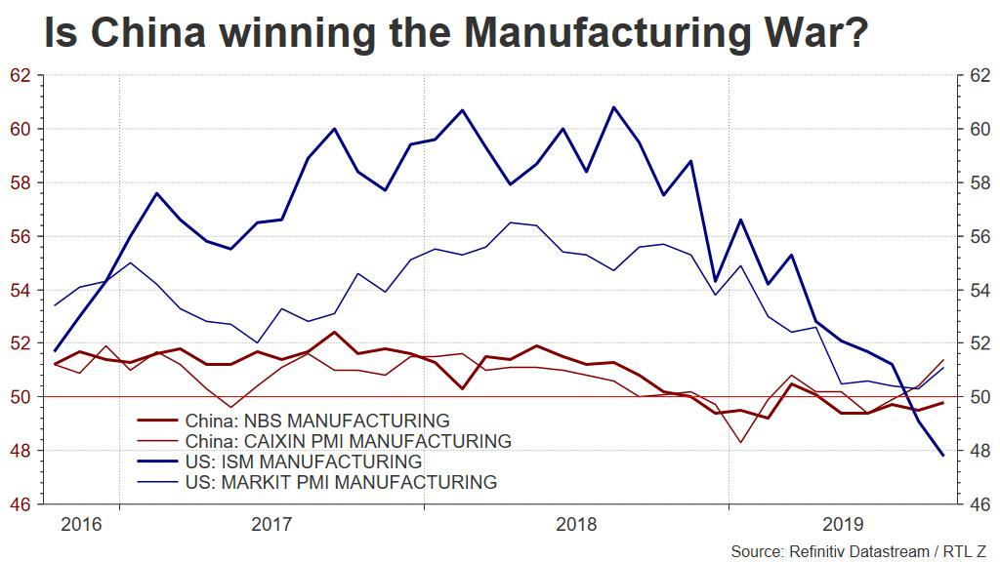




-----------------------------/----------------------------------------------------------------------

986
5dda8d38878dddefe2d56476

[]



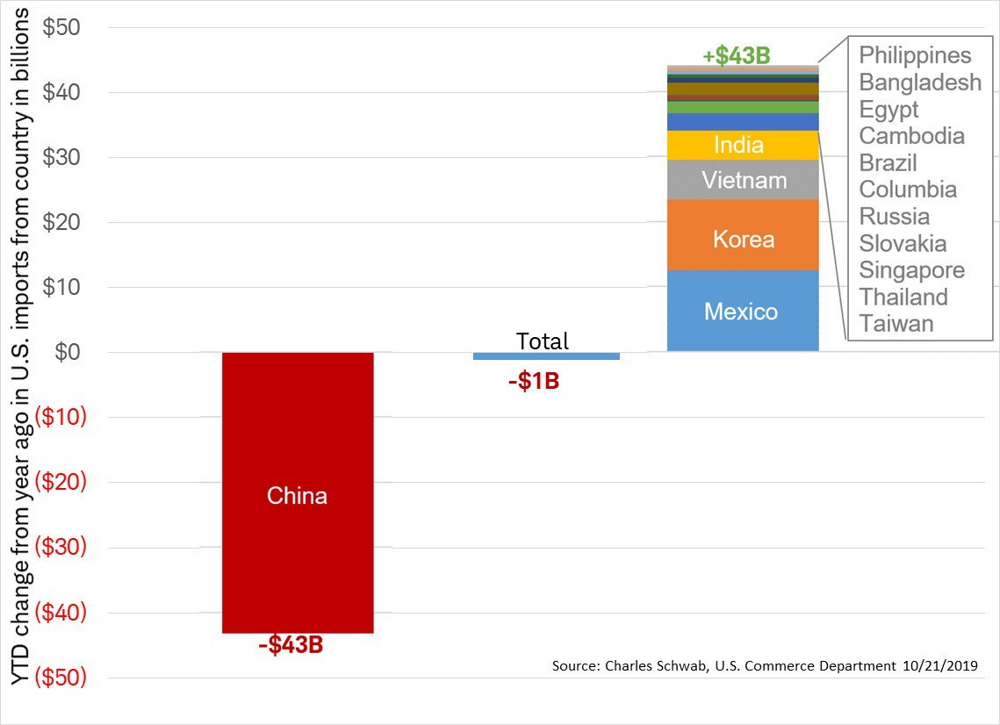




-----------------------------/----------------------------------------------------------------------

987
5dda8d3997a2dbd5c9889761

['Machinery and construction']



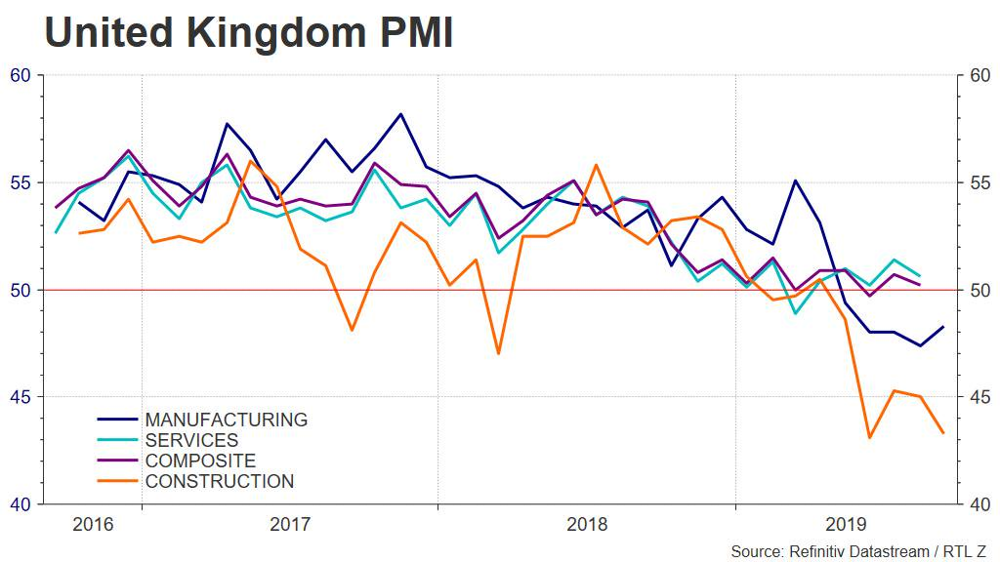




-----------------------------/----------------------------------------------------------------------

988
5dda8d39878dddefe2d56477

[]



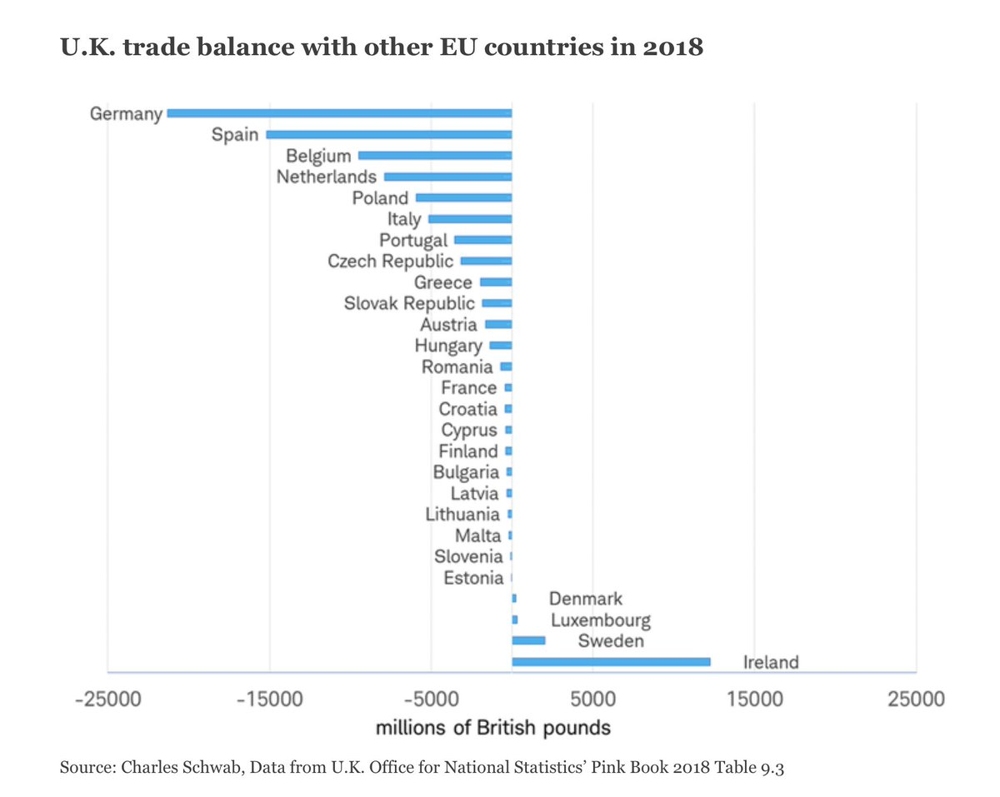




-----------------------------/----------------------------------------------------------------------

989
5dda8d3f878dddefe2d5647f

[]



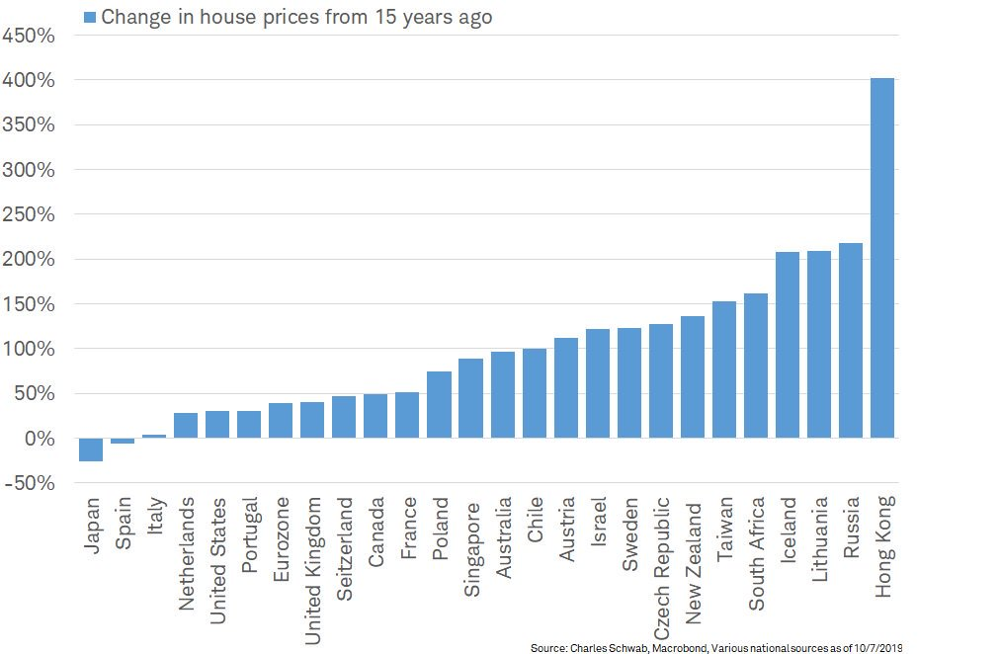




-----------------------------/----------------------------------------------------------------------

990
5dda8d46878dddefe2d56489

[]



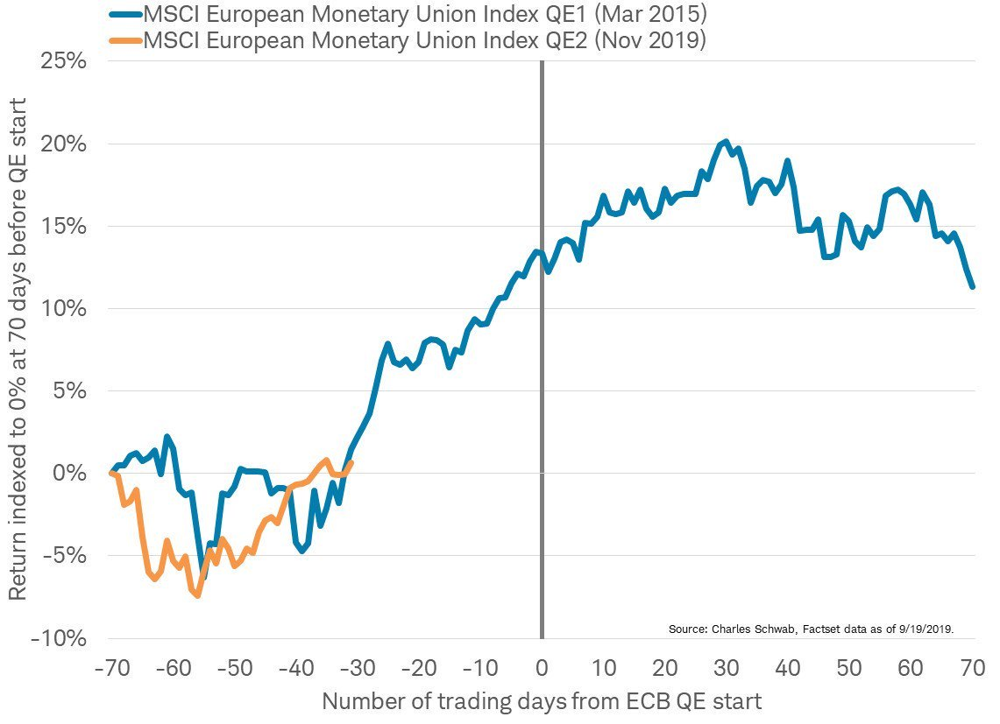




-----------------------------/----------------------------------------------------------------------

991
5dda8d4d878dddefe2d56493

['Banks insurance and finance']



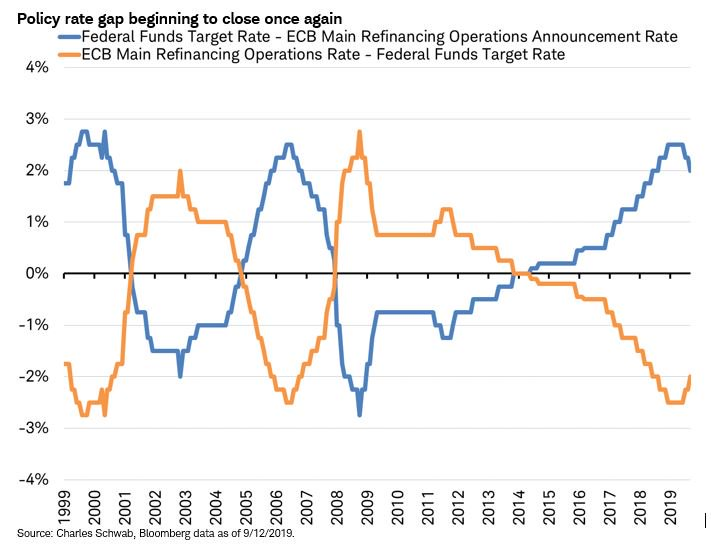




-----------------------------/----------------------------------------------------------------------

992
5dda8d4d878dddefe2d56494

['Banks insurance and finance']



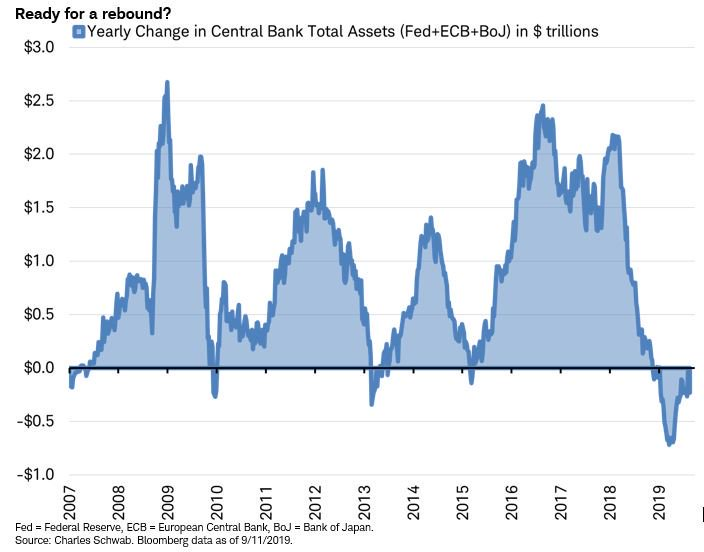




-----------------------------/----------------------------------------------------------------------

993
5dda8ef6878dddefe2d564fb

['Houses offices plants', 'Banks insurance and finance']



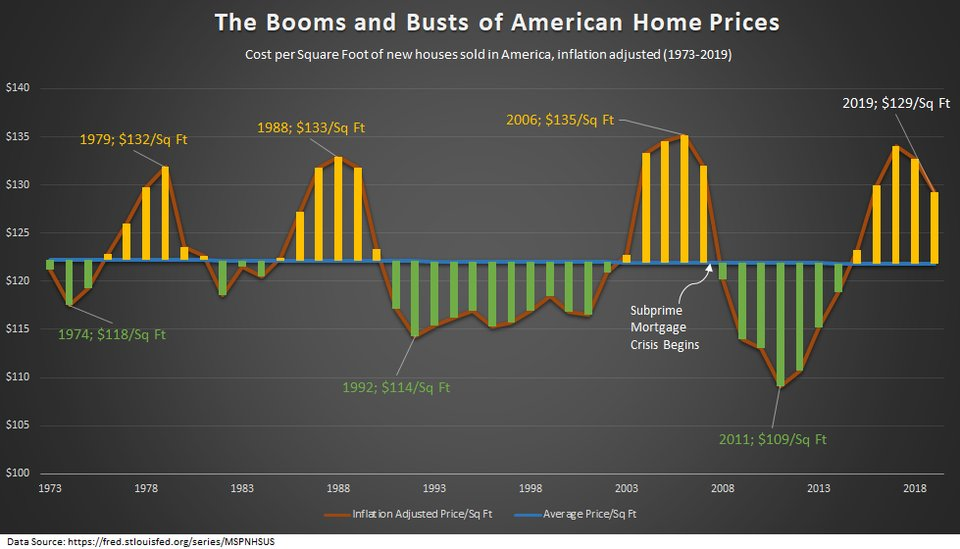




-----------------------------/----------------------------------------------------------------------

994
5dda915e97a2dbd5c98898b3

['Machinery and construction', 'Energy sources']



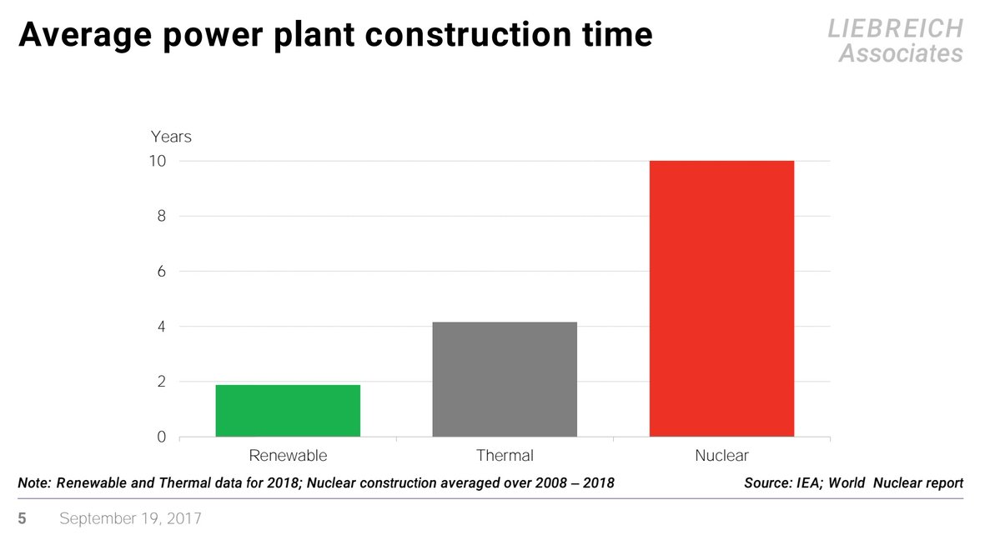




-----------------------------/----------------------------------------------------------------------

995
5dda922897a2dbd5c98898e5

['Energy sources']



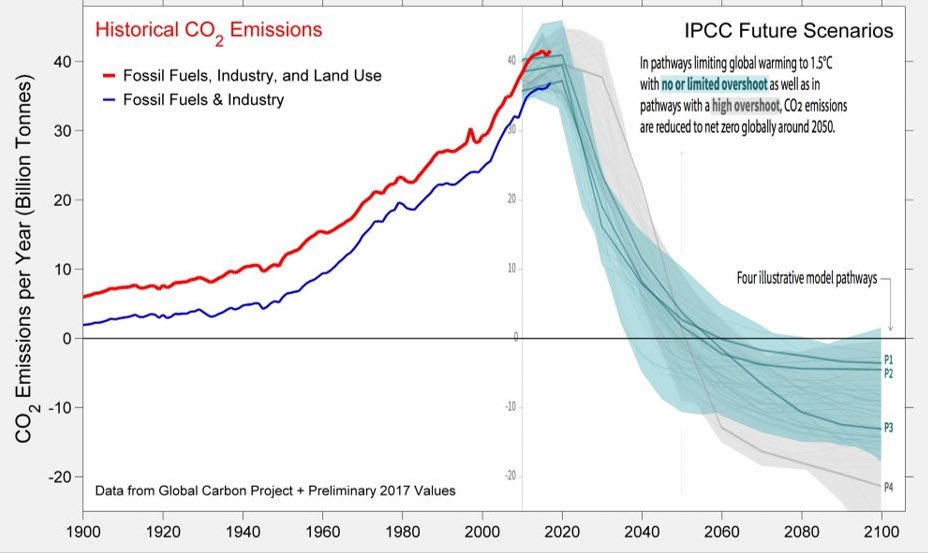




-----------------------------/----------------------------------------------------------------------

996
5dda93bc878dddefe2d56643

['Machinery and construction']



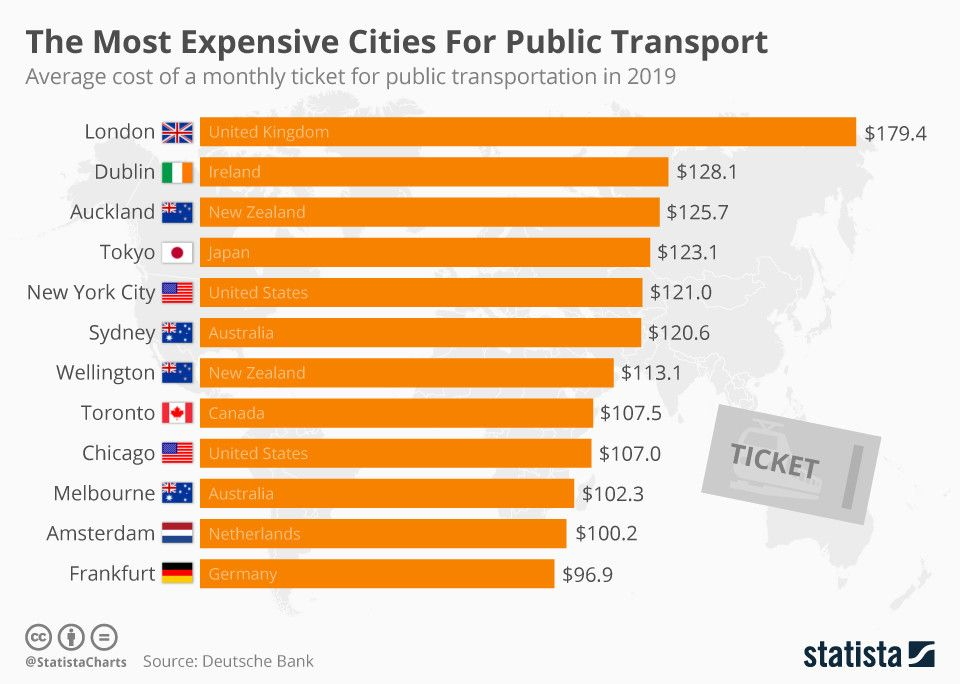




-----------------------------/----------------------------------------------------------------------

997
5dda952697a2dbd5c9889a0a

['Energy sources']



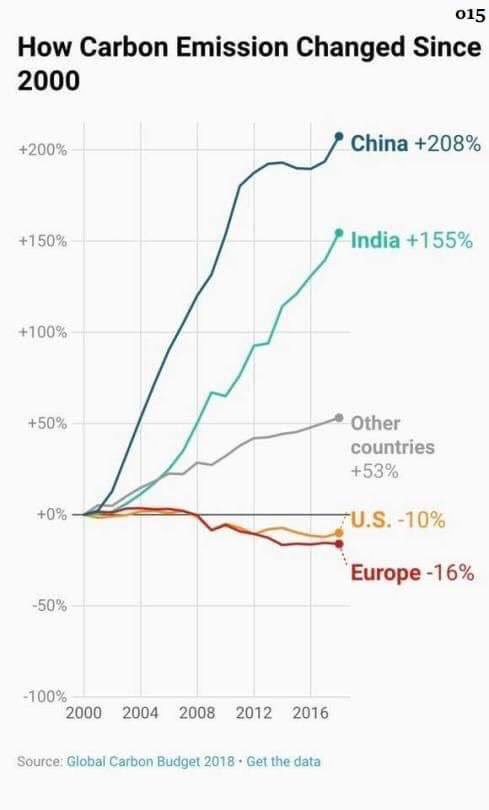




-----------------------------/----------------------------------------------------------------------

998
5dda958e97a2dbd5c9889a44

['Energy sources', 'Raw materials']



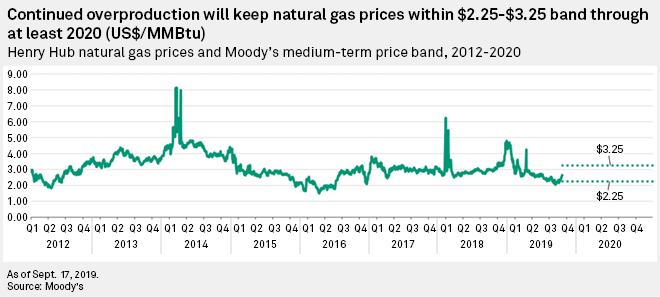




-----------------------------/----------------------------------------------------------------------

999
5dda967b97a2dbd5c9889a8d

['Banks insurance and finance']



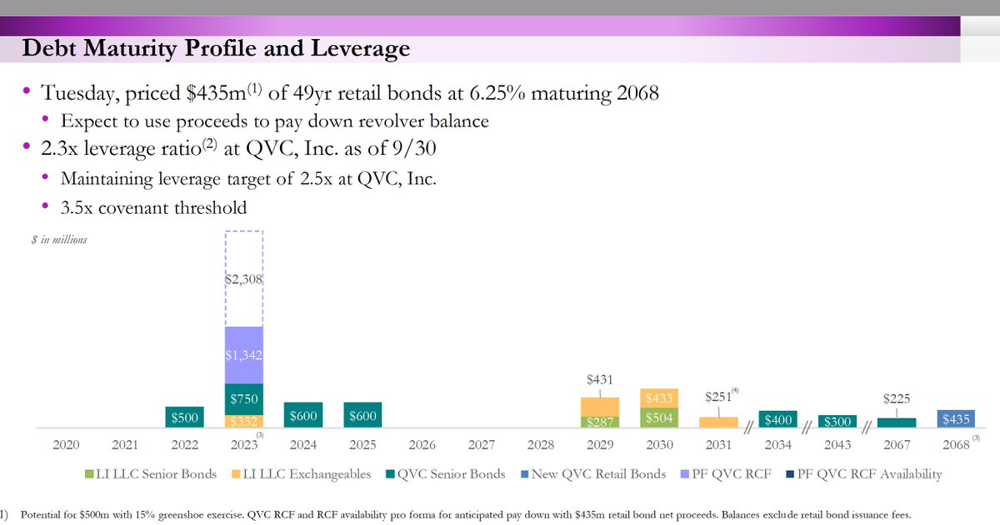




-----------------------------/----------------------------------------------------------------------

1000
5dda9a98878dddefe2d56949

['Machinery and construction', 'Houses offices plants']



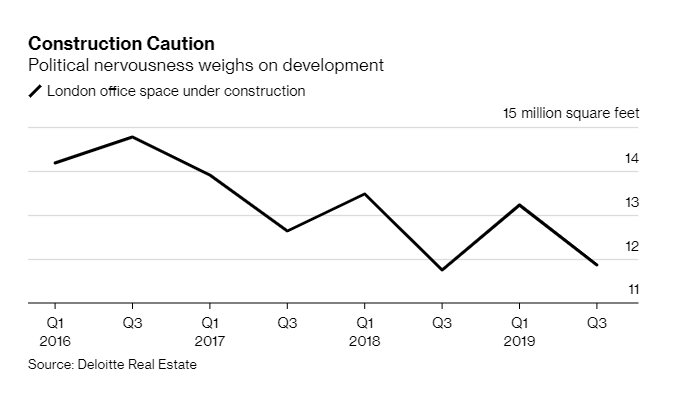




-----------------------------/----------------------------------------------------------------------

1001
5dda9cce878dddefe2d569f9

[]



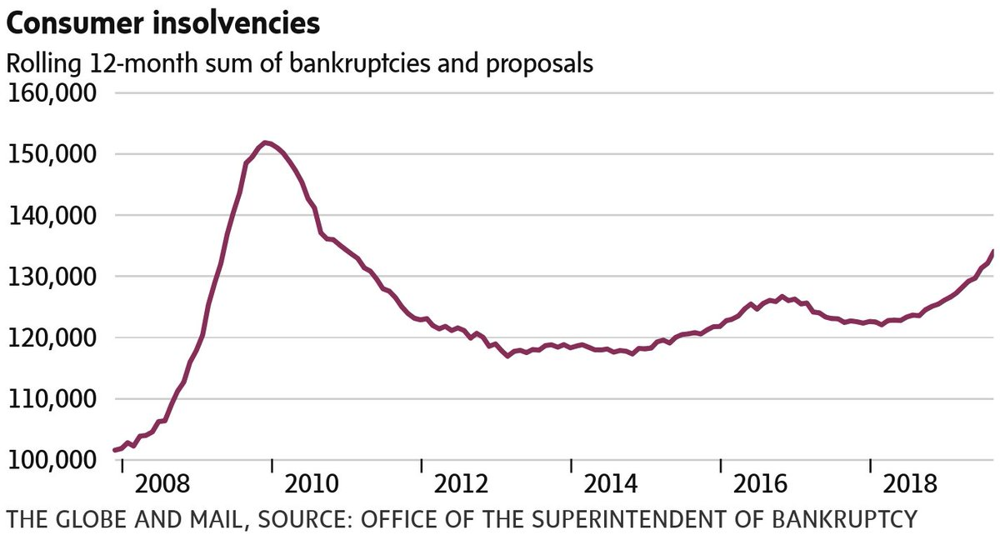




-----------------------------/----------------------------------------------------------------------

1002
5dda9d8297a2dbd5c9889d3b

[]



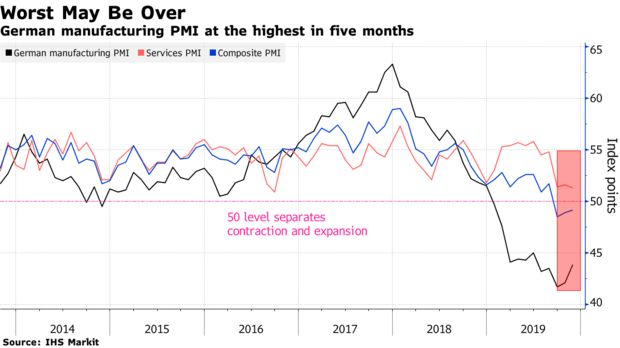




-----------------------------/----------------------------------------------------------------------

1003
5ddaa27397a2dbd5c9889ee1

['Houses offices plants']



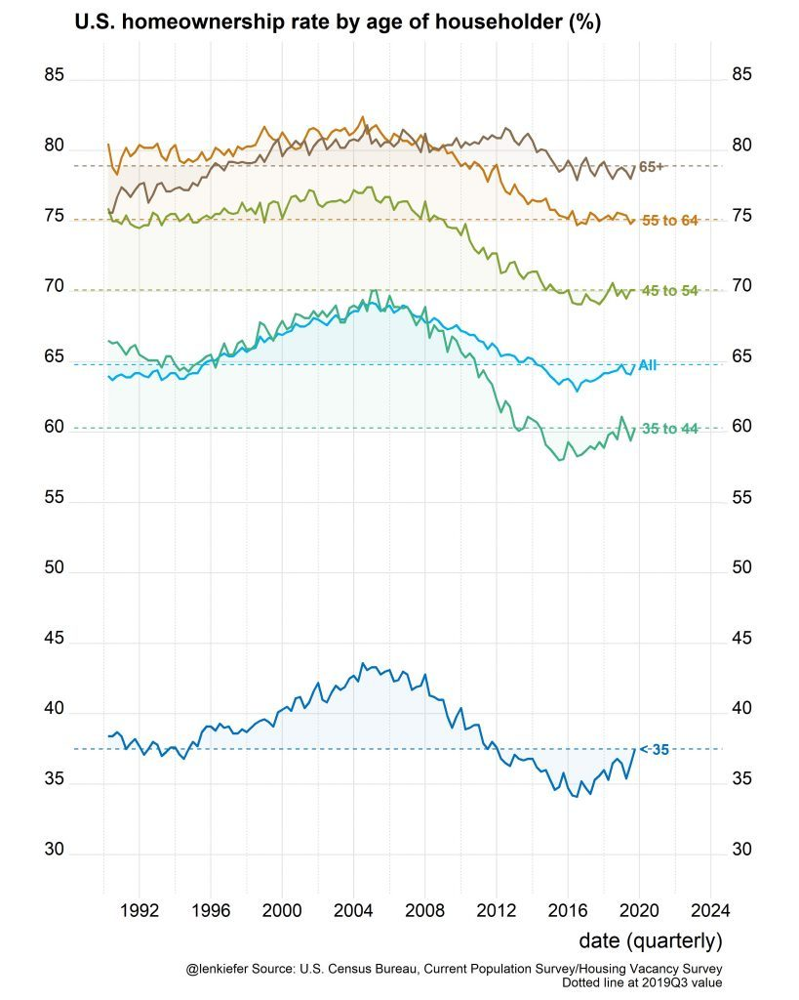




-----------------------------/----------------------------------------------------------------------

1004
5ddab18186facb54ae6c5d79

[]



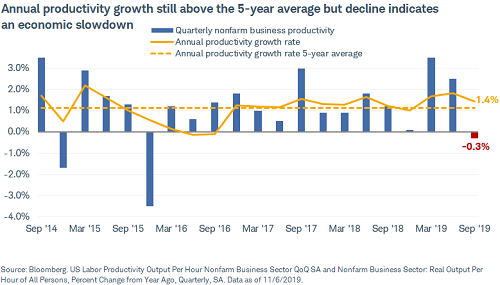




-----------------------------/----------------------------------------------------------------------

1005
5ddab18486facb54ae6c5d7d

['Machinery and construction']



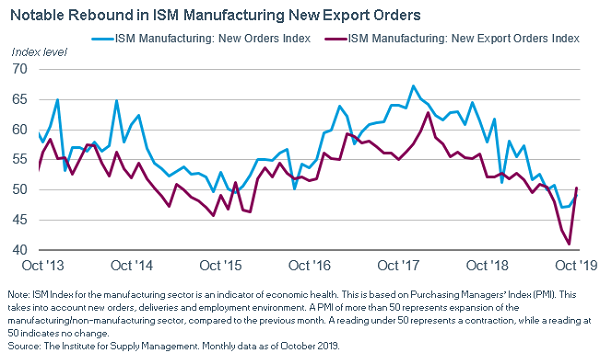




-----------------------------/----------------------------------------------------------------------

1006
5ddab18686facb54ae6c5d81

['Banks insurance and finance']



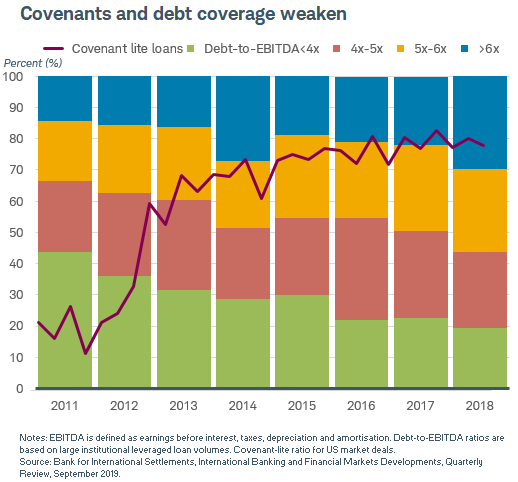




-----------------------------/----------------------------------------------------------------------

1007
5ddab18886facb54ae6c5d84

['Banks insurance and finance']



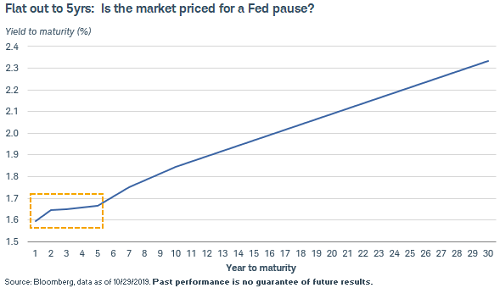




-----------------------------/----------------------------------------------------------------------

1008
5ddab19186facb54ae6c5d92

['Banks insurance and finance']



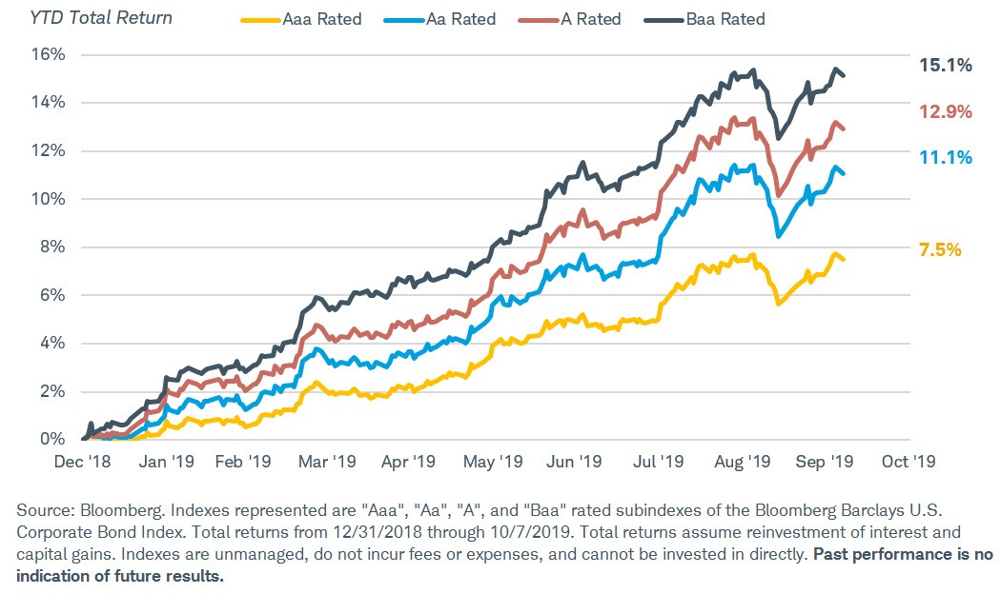




-----------------------------/----------------------------------------------------------------------

1009
5ddab19586facb54ae6c5d98

['Machinery and construction']



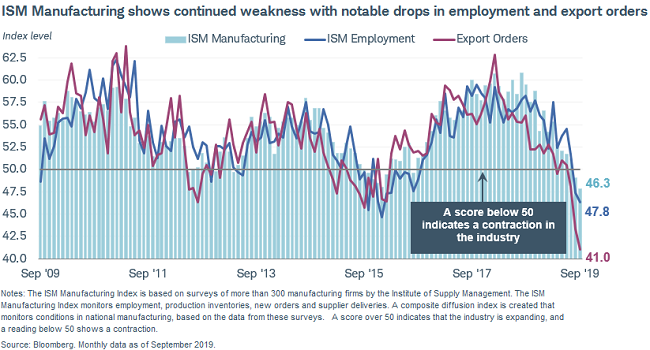




-----------------------------/----------------------------------------------------------------------

1010
5ddab34f86facb54ae6c5e2e

['Raw materials']



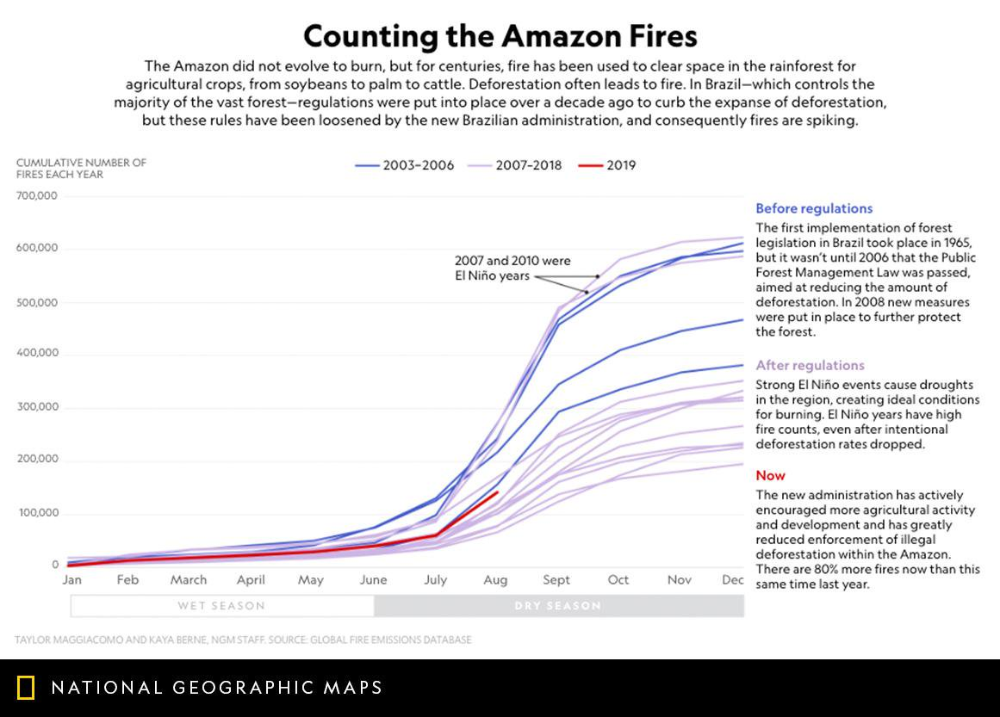




-----------------------------/----------------------------------------------------------------------

1011
5ddab4b7b3580e6d5d3e0b23

['Raw materials']



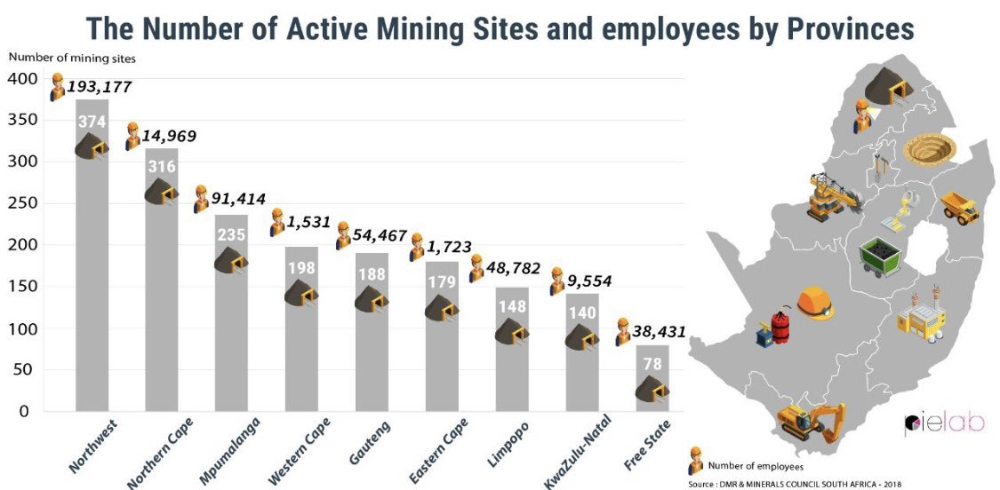




-----------------------------/----------------------------------------------------------------------

1012
5ddab5dbb3580e6d5d3e0b7c

[]



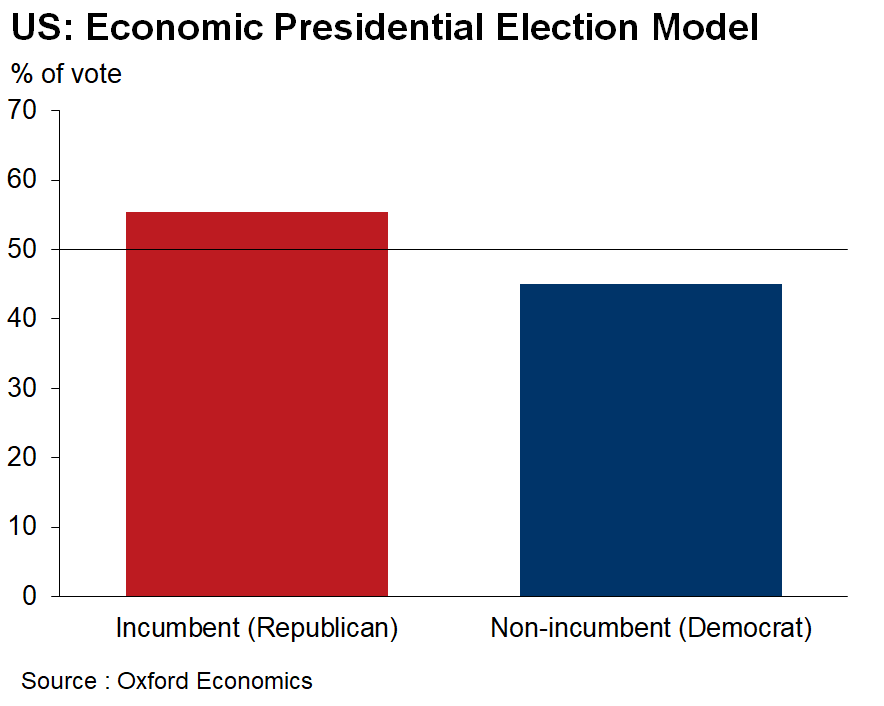




-----------------------------/----------------------------------------------------------------------

1013
5ddab83686facb54ae6c6065

['Energy sources', 'Raw materials']



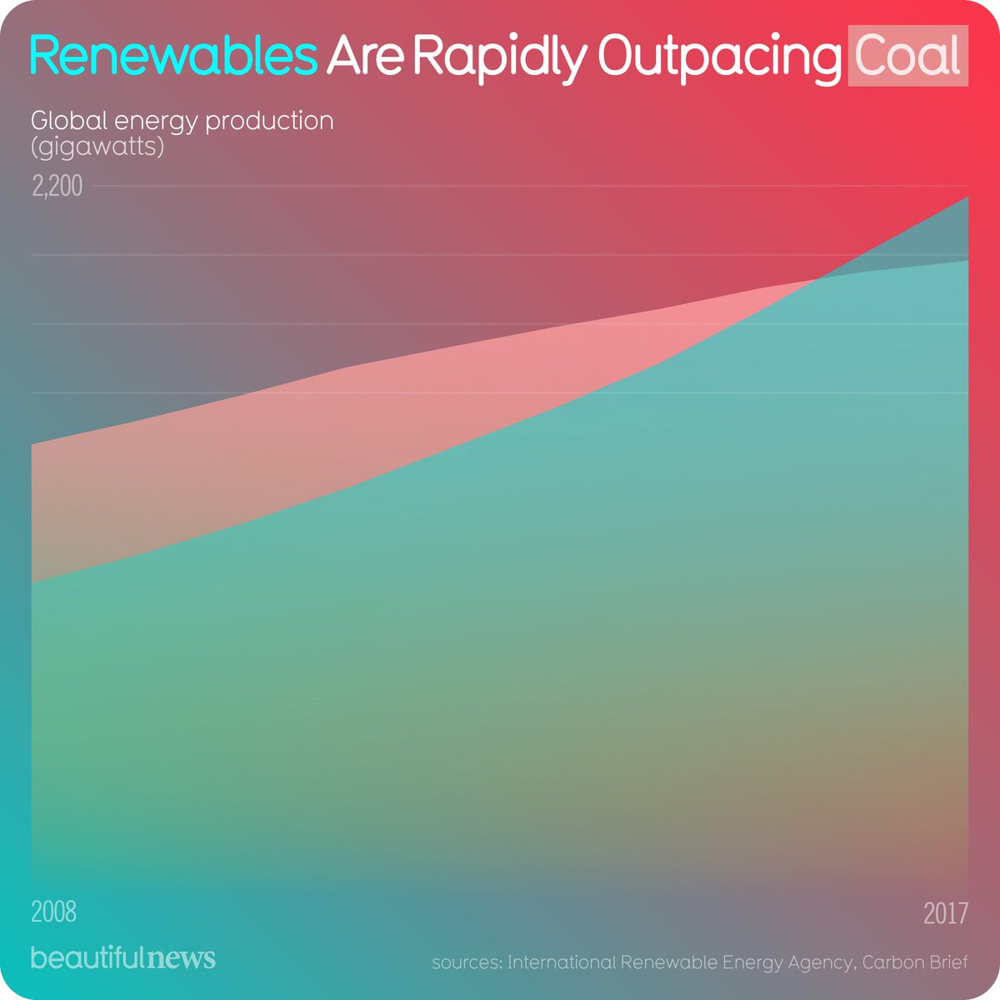




-----------------------------/----------------------------------------------------------------------

1014
5ddab83786facb54ae6c6067

[]



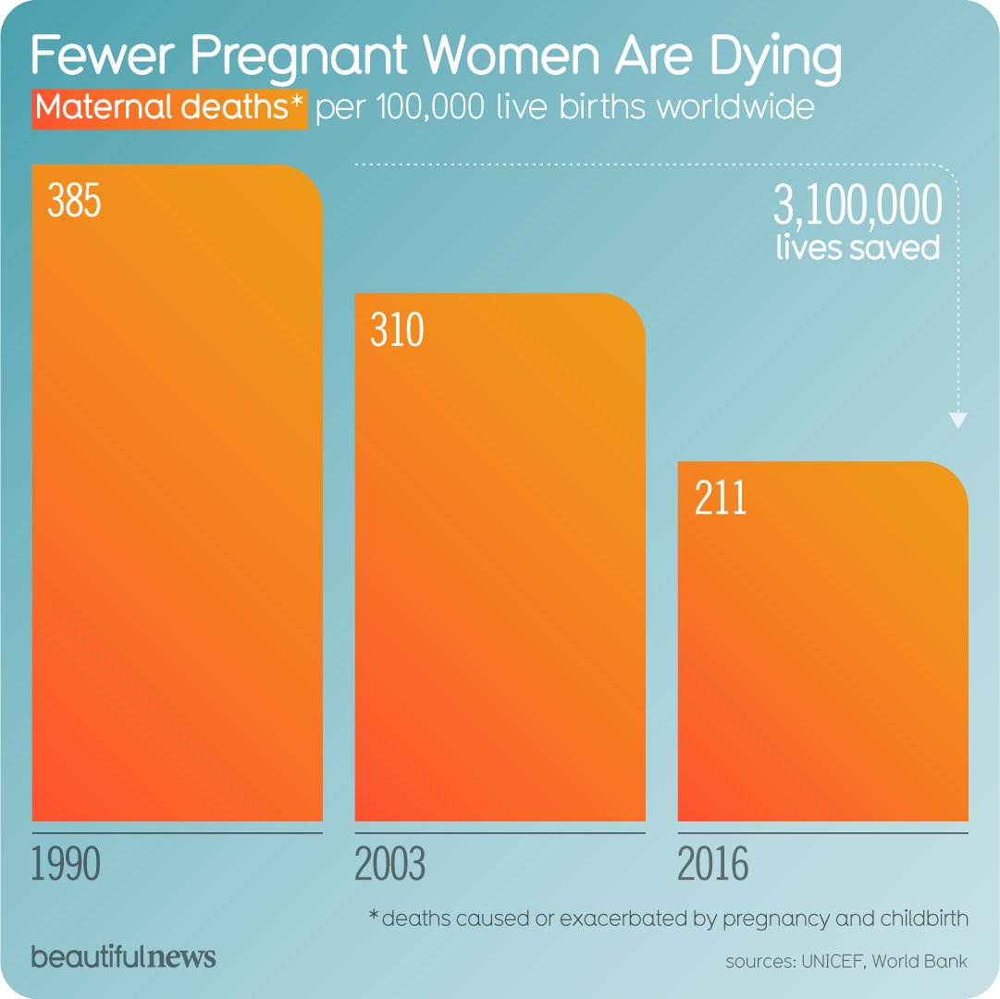




-----------------------------/----------------------------------------------------------------------

1015
5ddab84986facb54ae6c607f

['Energy sources']



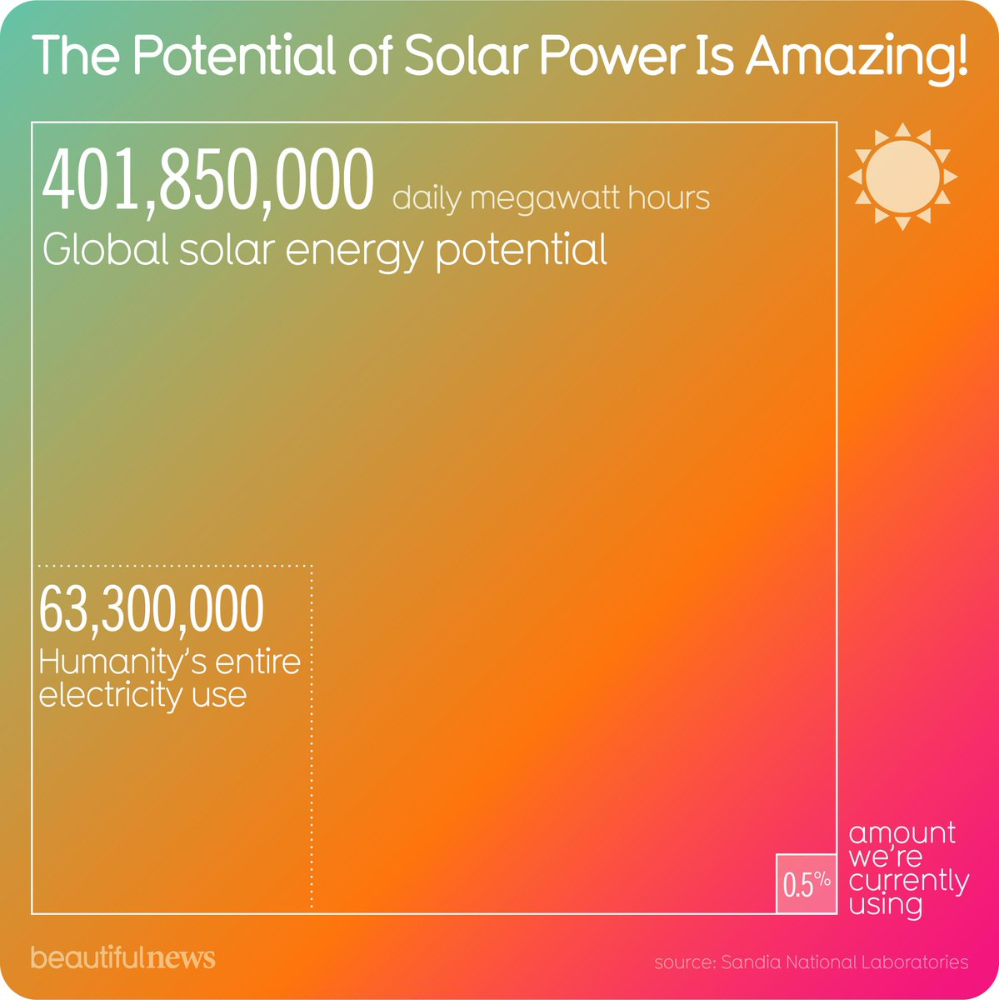




-----------------------------/----------------------------------------------------------------------

1016
5ddab9fd86facb54ae6c60ea

[]



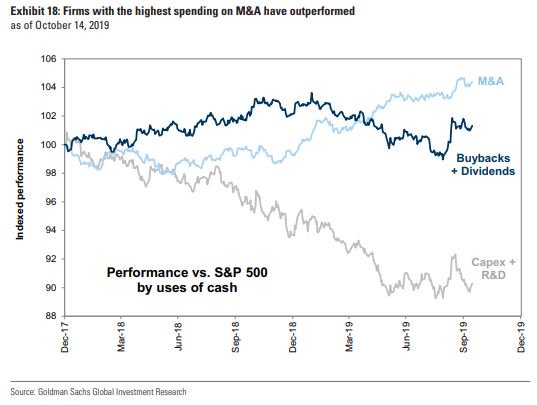




-----------------------------/----------------------------------------------------------------------

1017
5ddabadcb3580e6d5d3e0d9b

['Banks insurance and finance']



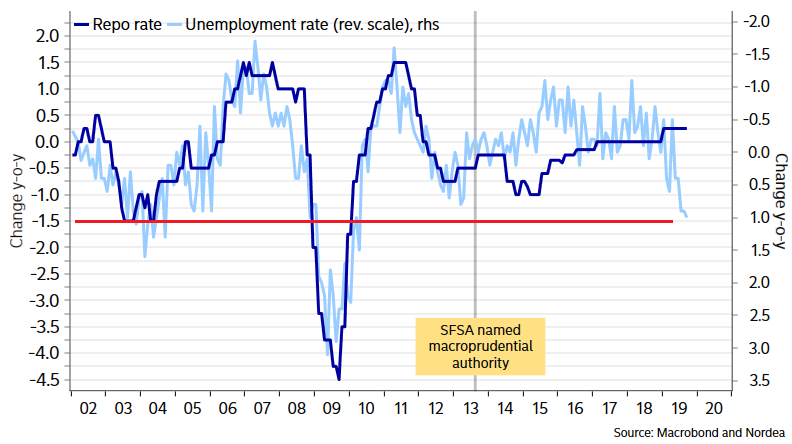




-----------------------------/----------------------------------------------------------------------

1018
5ddac280b3580e6d5d3e1139

['Banks insurance and finance']



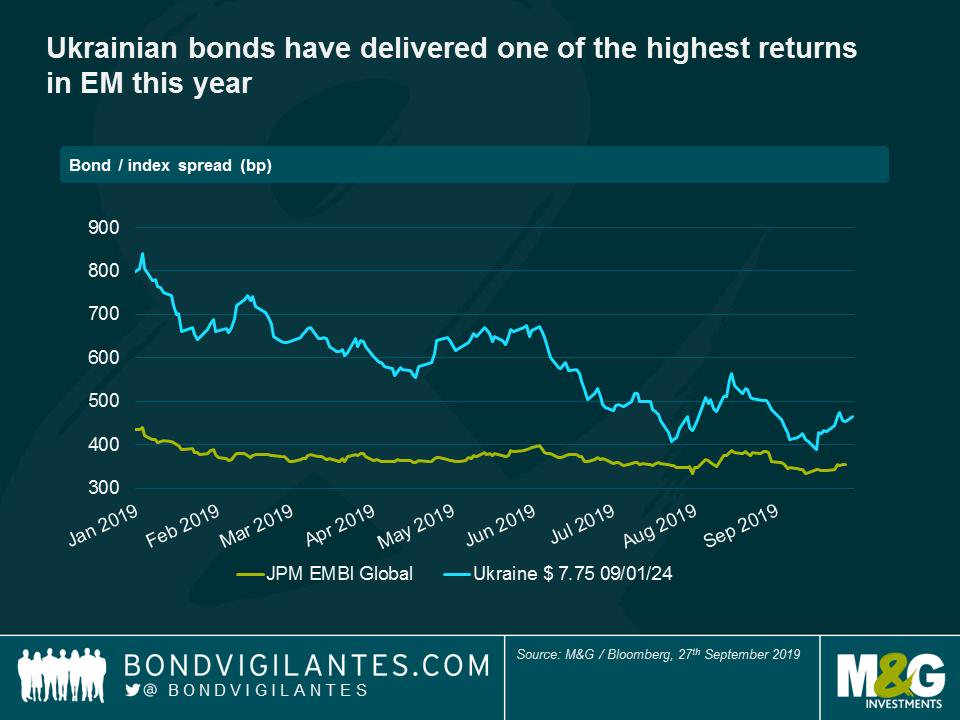




-----------------------------/----------------------------------------------------------------------

1019
5ddac280b3580e6d5d3e113a

[]



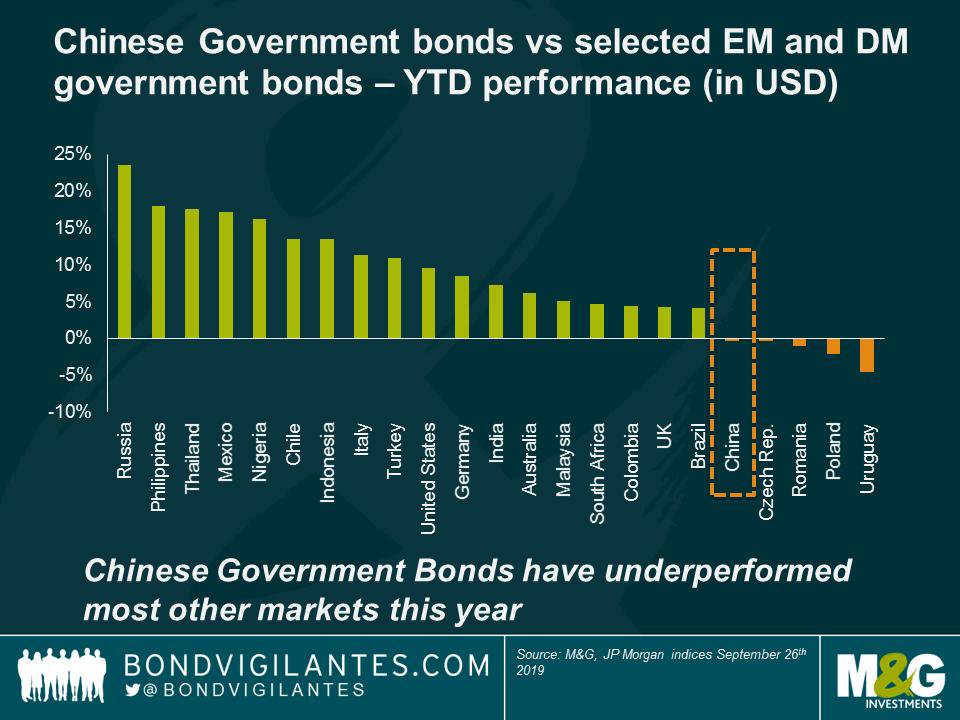




-----------------------------/----------------------------------------------------------------------

1020
5ddac4d0b3580e6d5d3e1237

[]



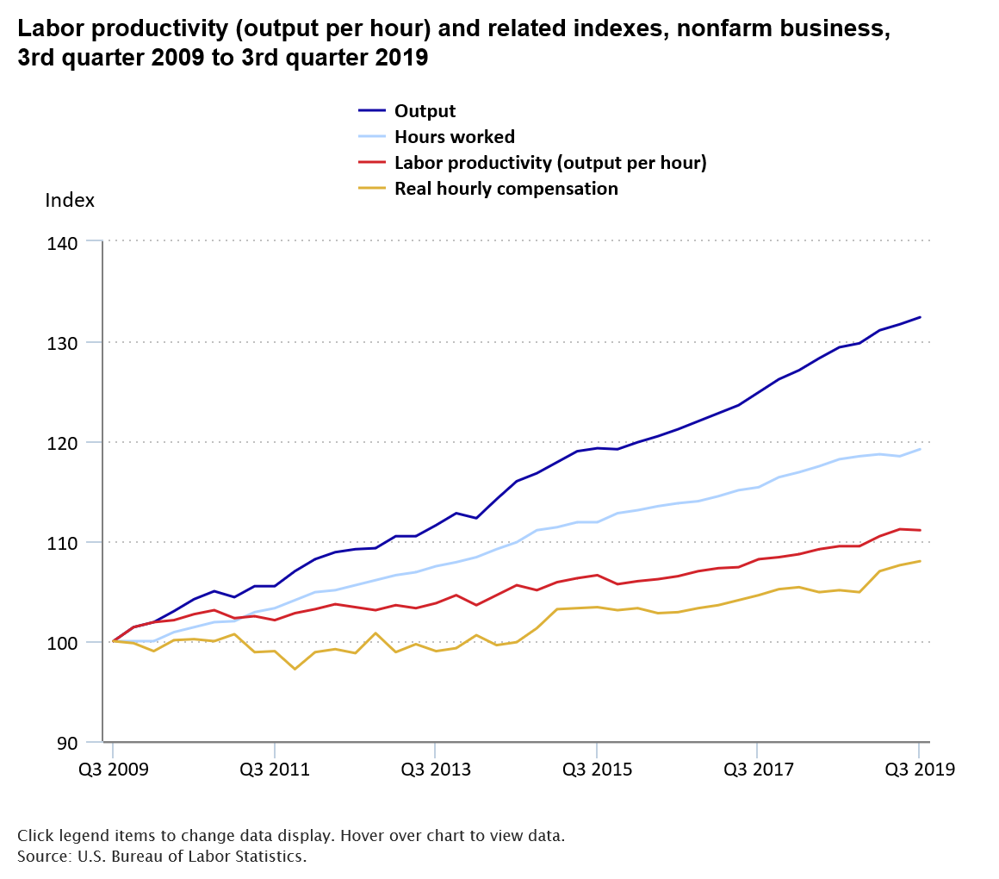




-----------------------------/----------------------------------------------------------------------

1021
5ddac4d1b3580e6d5d3e1239

['Your health', 'Machinery and construction', 'Banks insurance and finance', 'Cars clothes and other staff', 'Raw materials', 'Networks and communications']



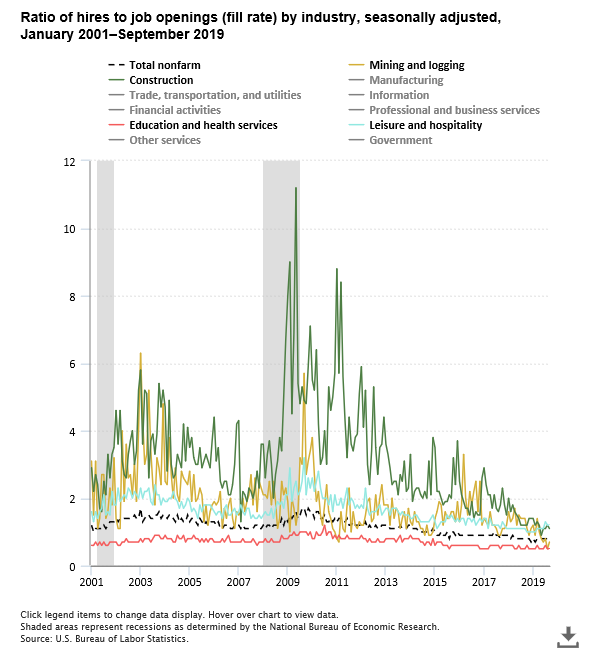




-----------------------------/----------------------------------------------------------------------

1022
5ddac4d4b3580e6d5d3e123e

[]



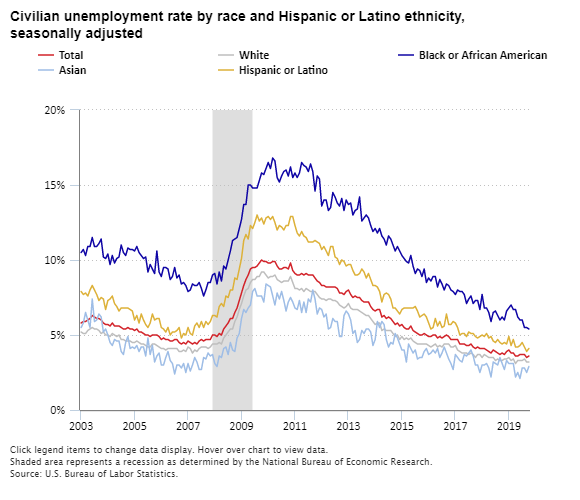




-----------------------------/----------------------------------------------------------------------

1023
5ddac4dab3580e6d5d3e1246

['Cars clothes and other staff', 'Eat and drink', 'Machinery and construction', 'Technology as you know it', 'Networks and communications']



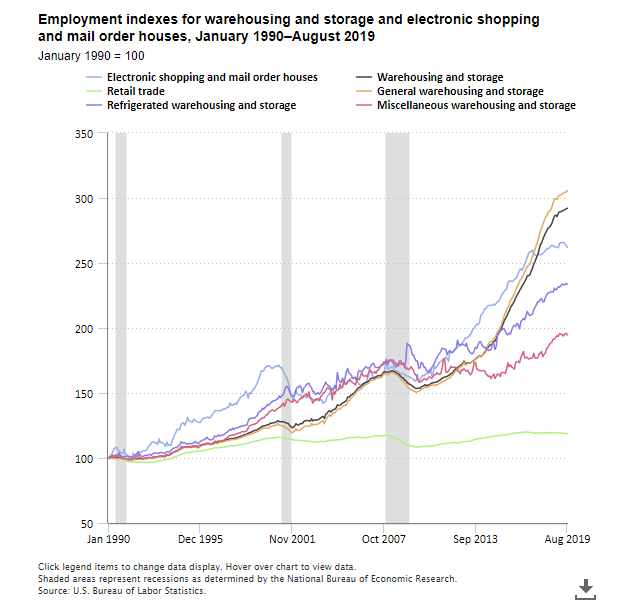




-----------------------------/----------------------------------------------------------------------

1024
5ddac4deb3580e6d5d3e124b

['Your health']



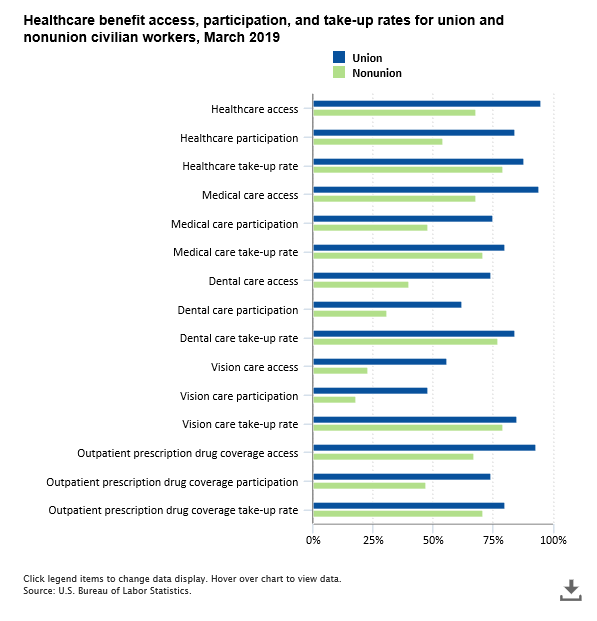




-----------------------------/----------------------------------------------------------------------

1025
5ddac4e1b3580e6d5d3e124f

['Your health', 'Machinery and construction']



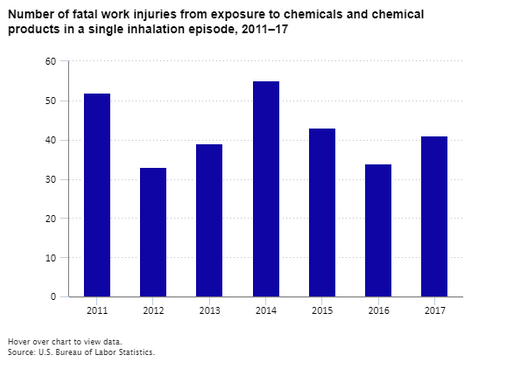




-----------------------------/----------------------------------------------------------------------

1026
5ddac4e4b3580e6d5d3e1254

['Raw materials']



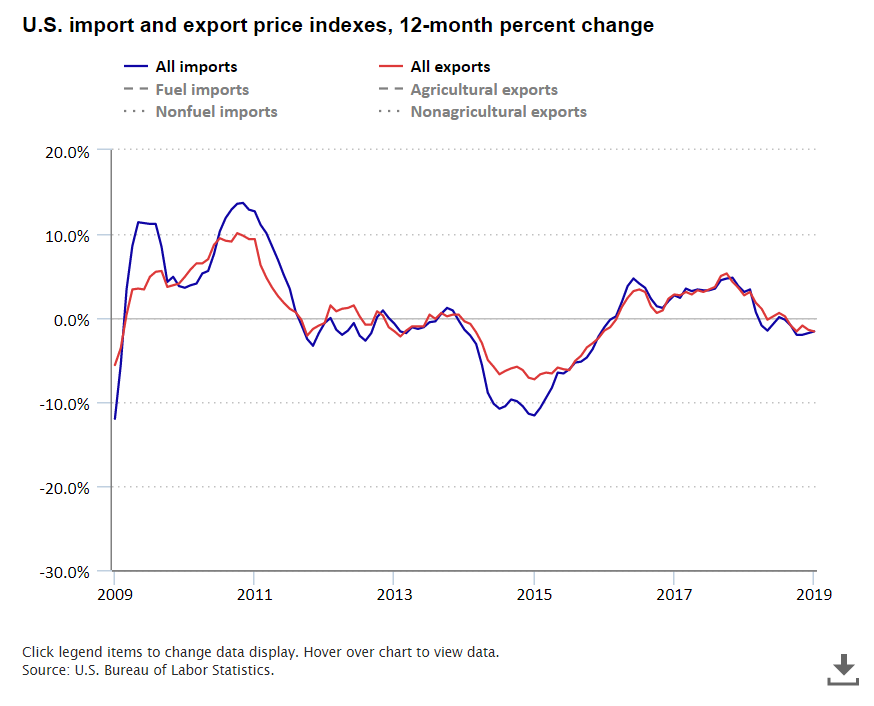




-----------------------------/----------------------------------------------------------------------

1027
5ddac4e6b3580e6d5d3e1256

[]



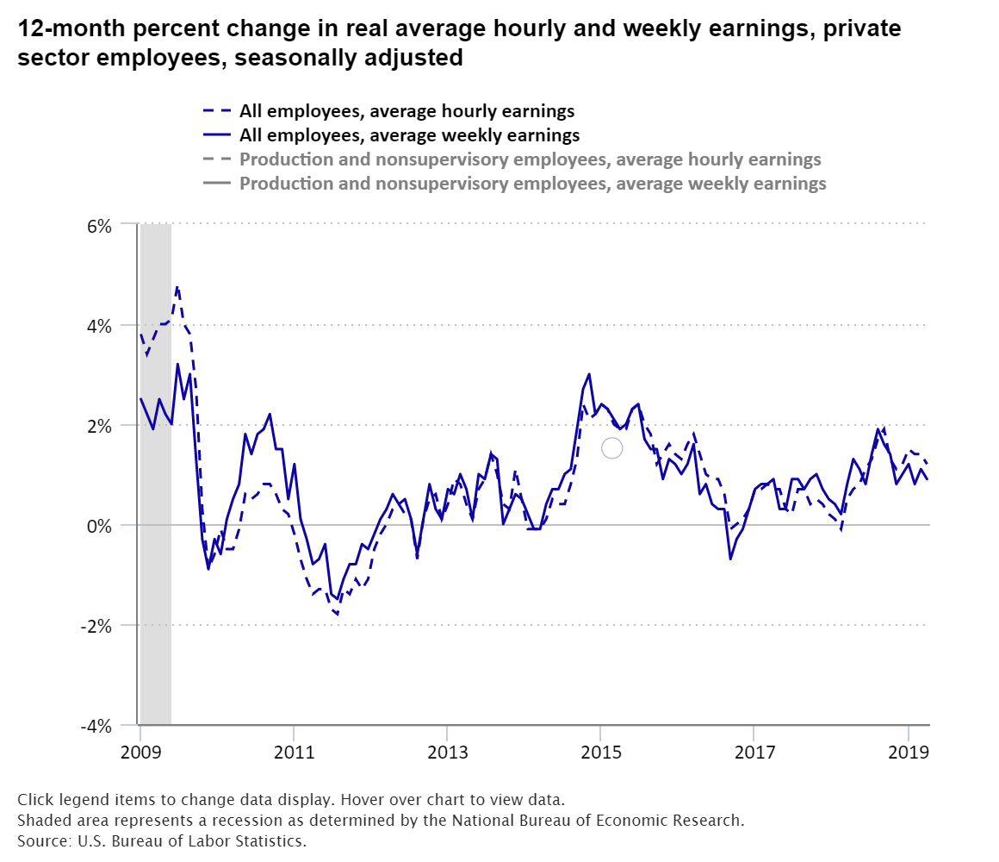




-----------------------------/----------------------------------------------------------------------

1028
5ddac4e9b3580e6d5d3e125a

['Eat and drink', 'Energy sources']



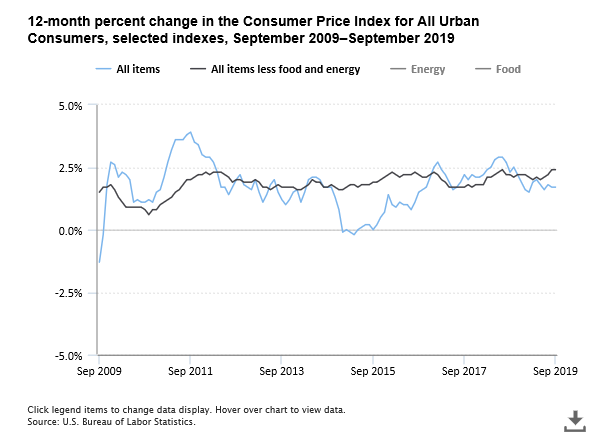




-----------------------------/----------------------------------------------------------------------

1029
5ddac4edb3580e6d5d3e1260

['Cars clothes and other staff', 'Eat and drink', 'Machinery and construction']



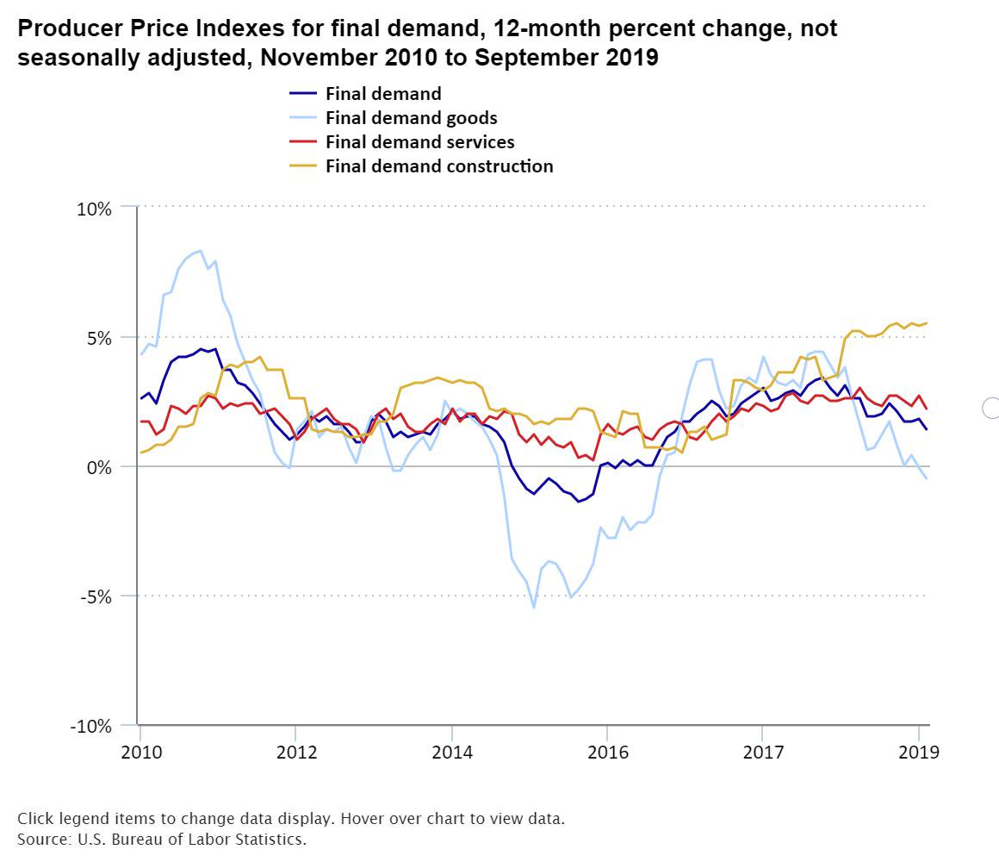




-----------------------------/----------------------------------------------------------------------

1030
5ddac4efb3580e6d5d3e1262

[]



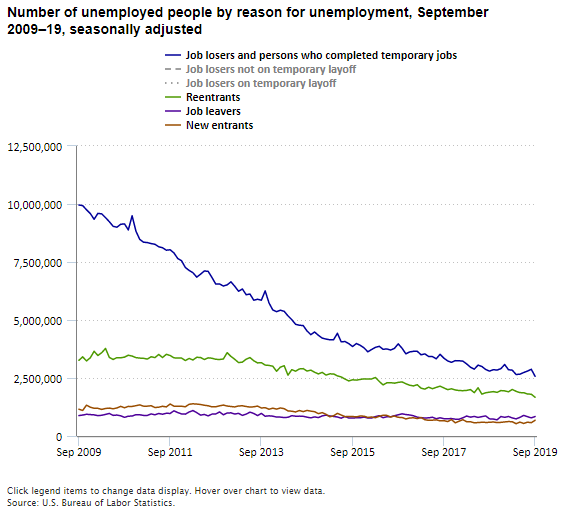




-----------------------------/----------------------------------------------------------------------

1031
5ddac4f2b3580e6d5d3e1267

[]



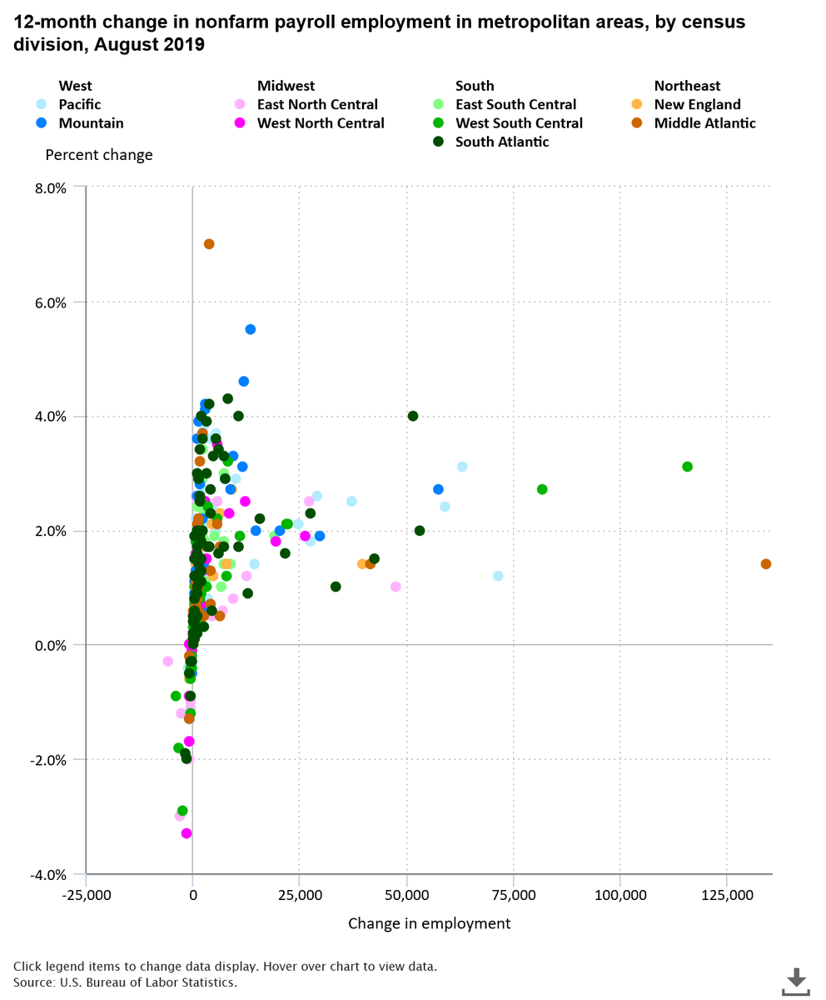




-----------------------------/----------------------------------------------------------------------

1032
5ddac4f5b3580e6d5d3e126b

['Machinery and construction']



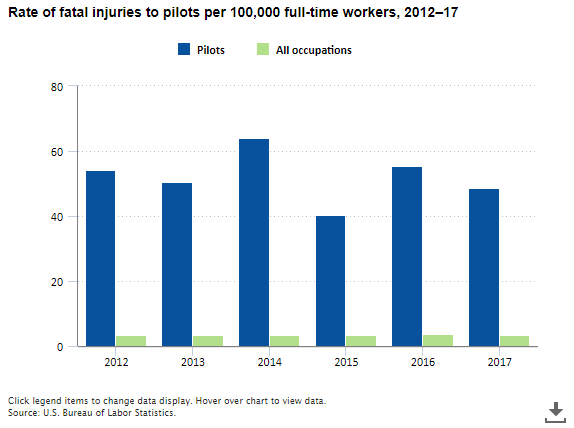




-----------------------------/----------------------------------------------------------------------

1033
5ddac4f7b3580e6d5d3e126d

[]



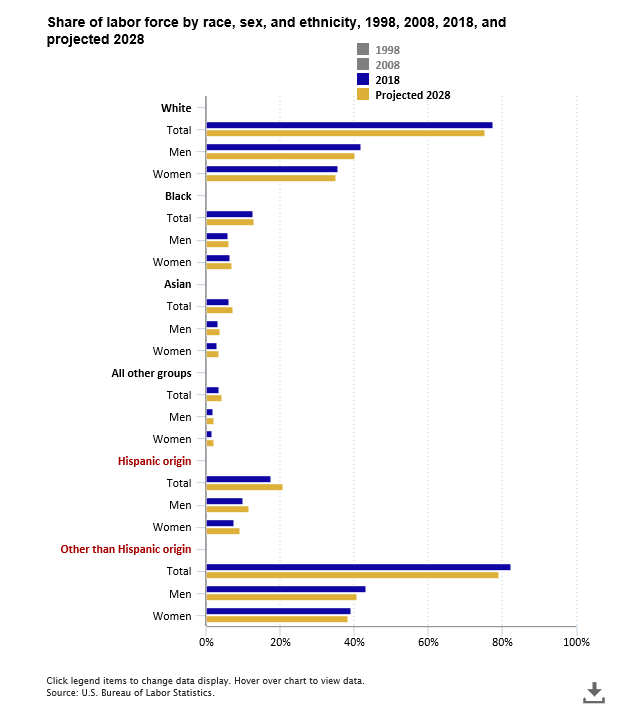




-----------------------------/----------------------------------------------------------------------

1034
5ddac90eb3580e6d5d3e1393

['Eat and drink']



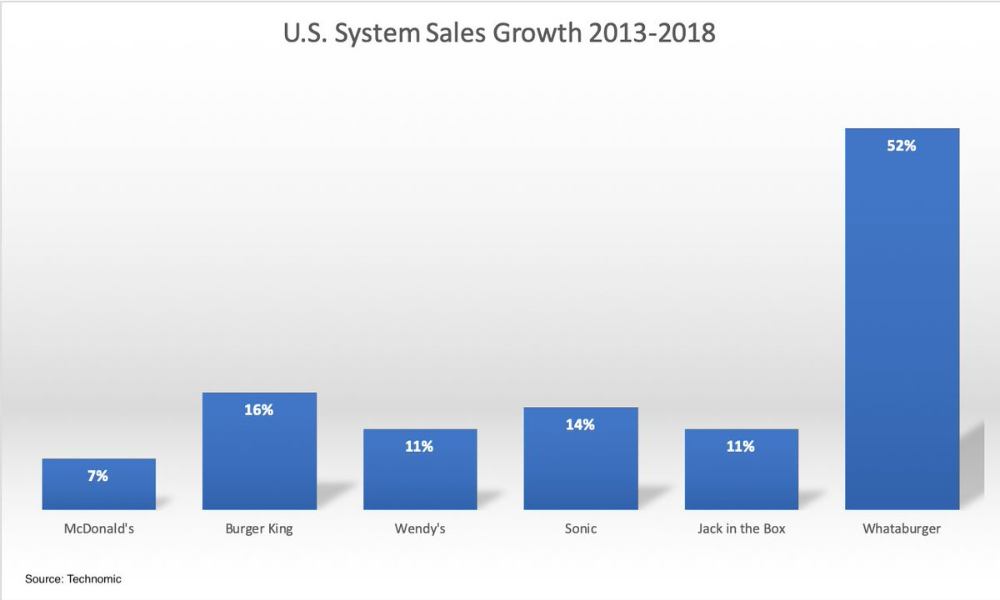




-----------------------------/----------------------------------------------------------------------

1035
5ddac96cb3580e6d5d3e13b0

['Machinery and construction']



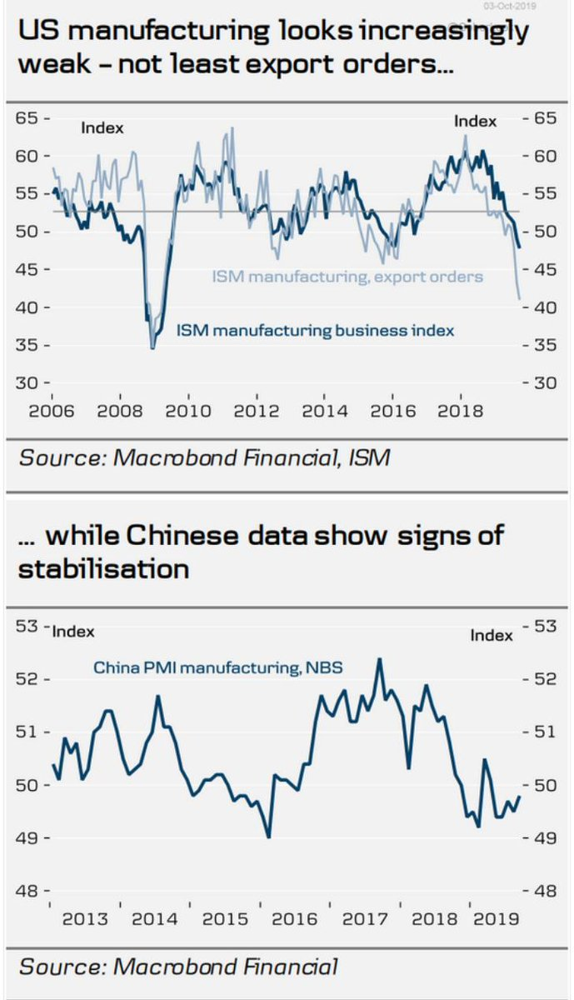




-----------------------------/----------------------------------------------------------------------

1036
5ddac96db3580e6d5d3e13b2

[]



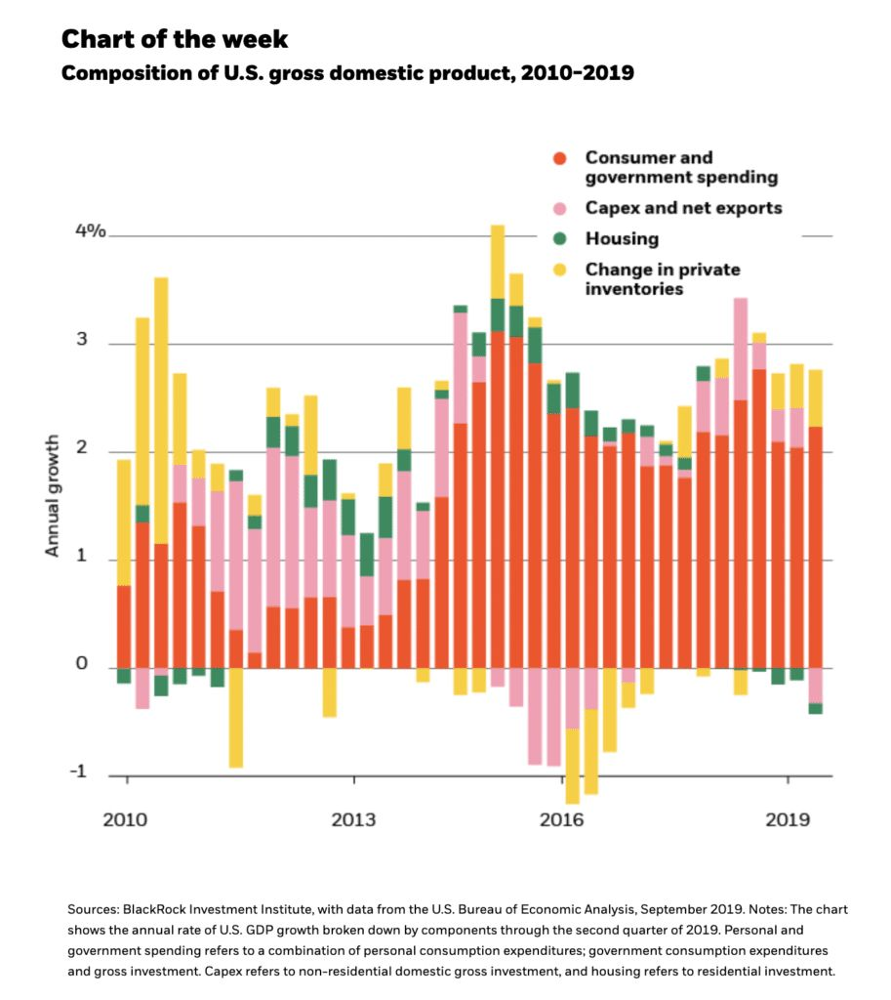




-----------------------------/----------------------------------------------------------------------

1037
5ddaca26b3580e6d5d3e13f4

[]



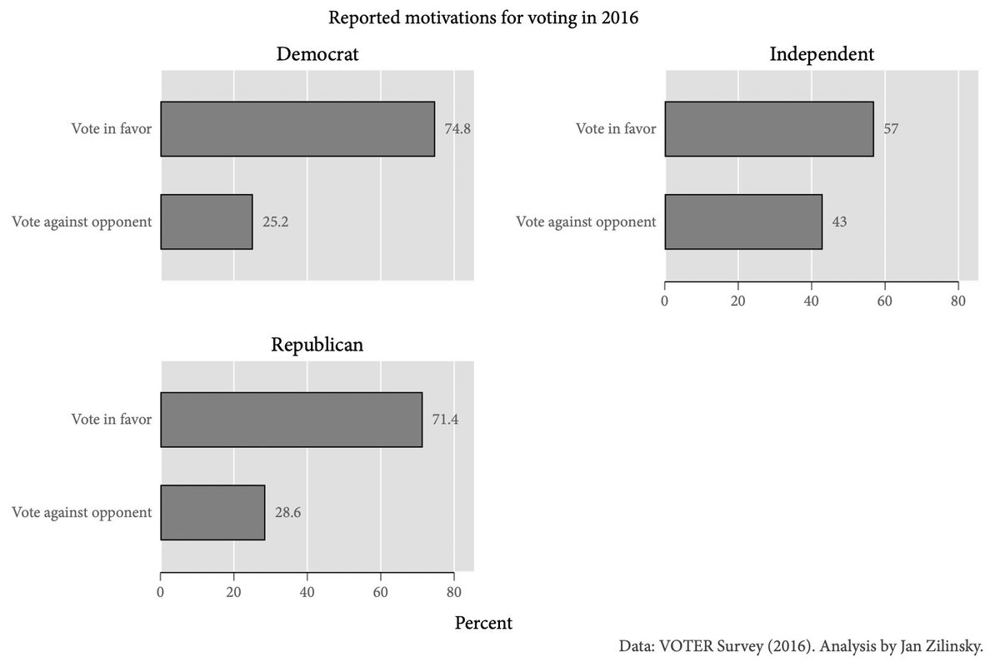




-----------------------------/----------------------------------------------------------------------

1038
5ddaca2bb3580e6d5d3e13fc

[]



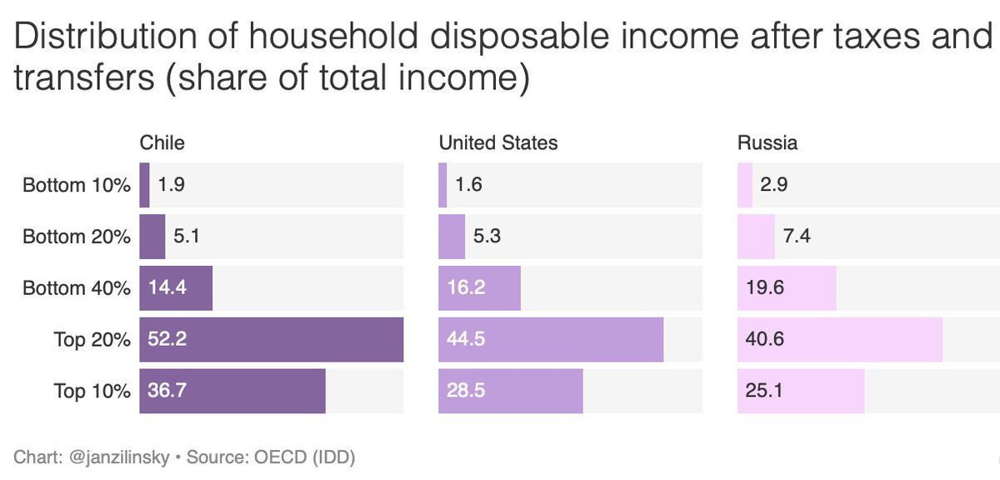




-----------------------------/----------------------------------------------------------------------

1039
5ddaca97b3580e6d5d3e1423

['Cars clothes and other staff']



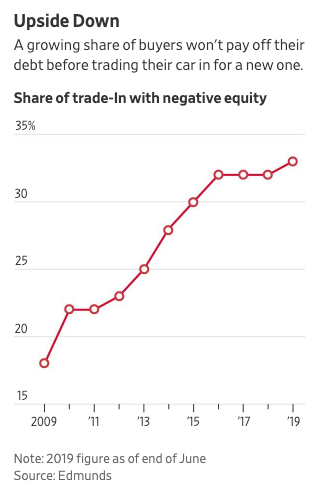




-----------------------------/----------------------------------------------------------------------

1040
5ddacbceb3580e6d5d3e14b0

['Banks insurance and finance']



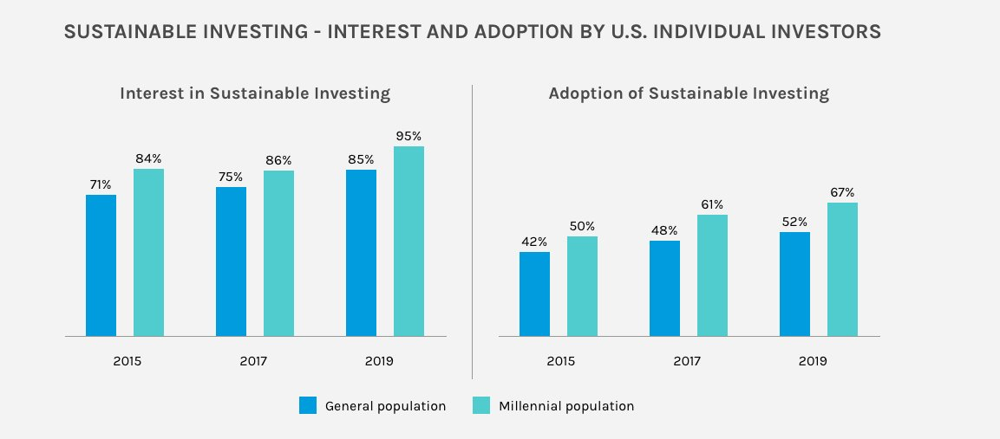




-----------------------------/----------------------------------------------------------------------

1041
5ddacd23b3580e6d5d3e1546

[]



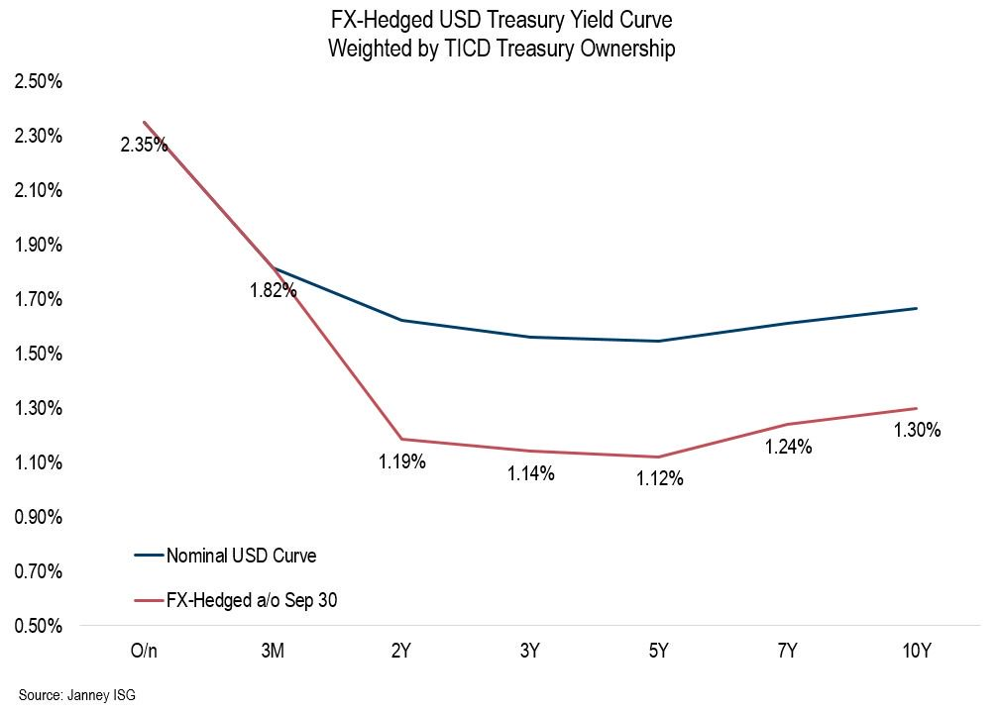




-----------------------------/----------------------------------------------------------------------

1042
5ddacd3f86facb54ae6c6952

['Banks insurance and finance']



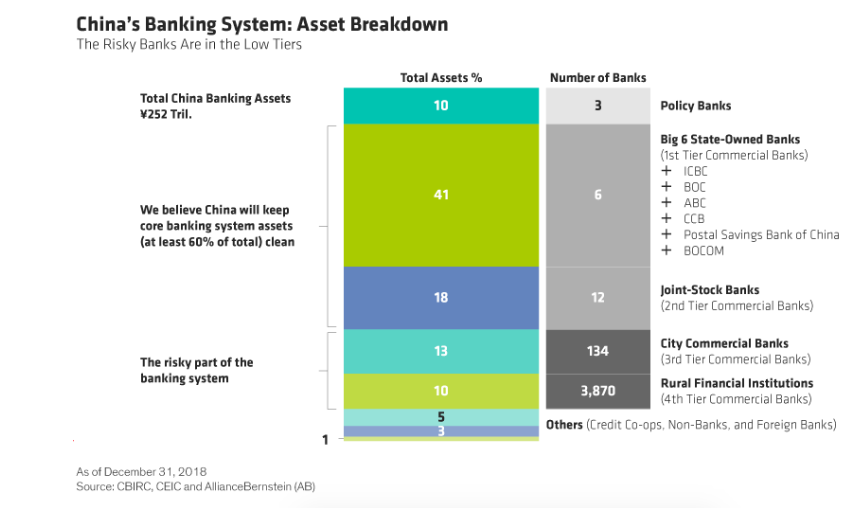




-----------------------------/----------------------------------------------------------------------

1043
5ddad33186facb54ae6c6c10

[]



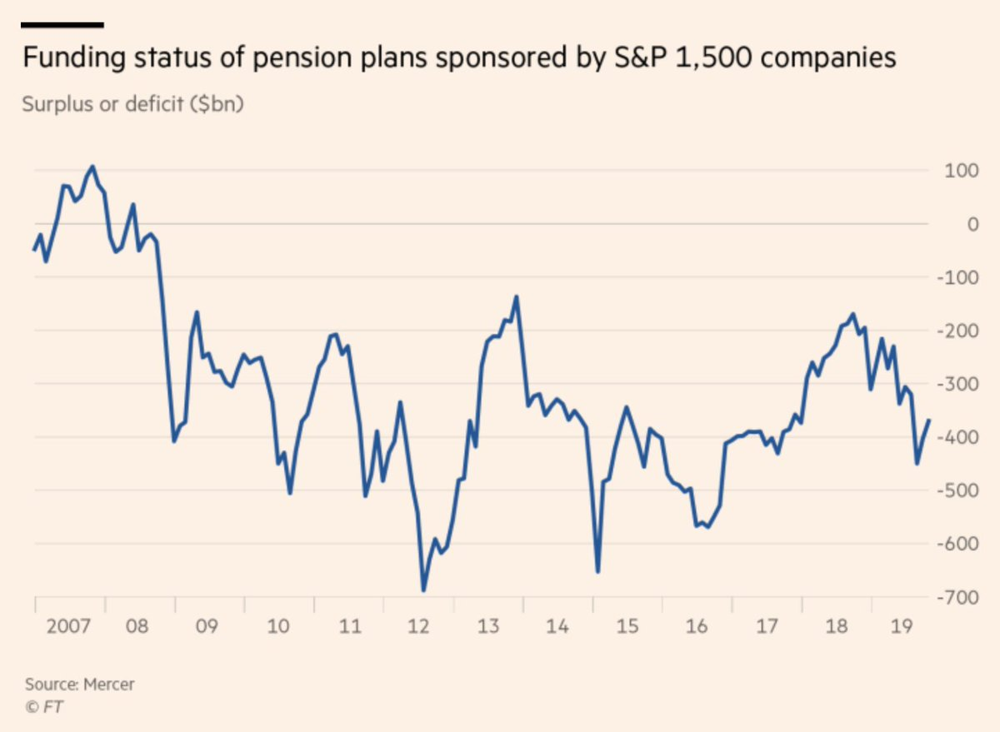




-----------------------------/----------------------------------------------------------------------

1044
5ddad692b3580e6d5d3e191c

['Machinery and construction', 'Your health', 'Eat and drink', 'Networks and communications', 'Banks insurance and finance']



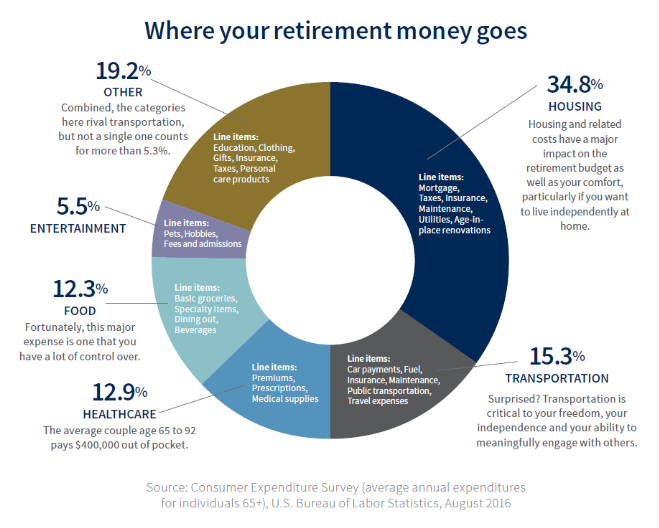




-----------------------------/----------------------------------------------------------------------

1045
5ddae0a786facb54ae6c7143

['Houses offices plants']



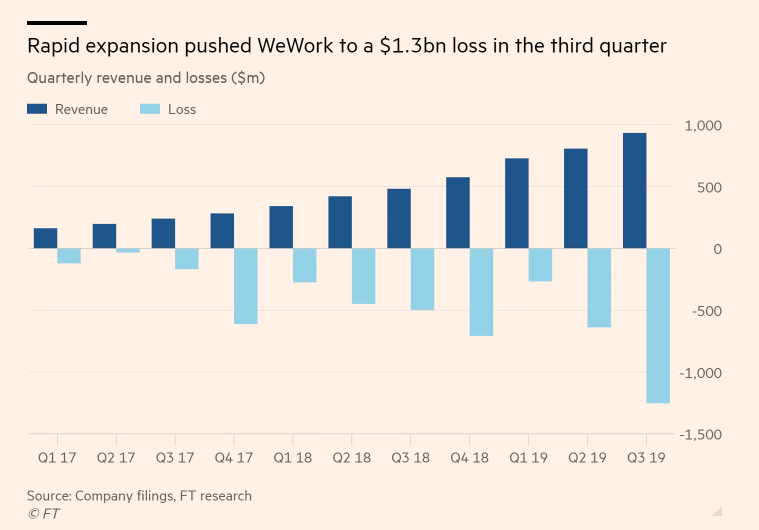




-----------------------------/----------------------------------------------------------------------

1046
5ddae72d86facb54ae6c7322

[]



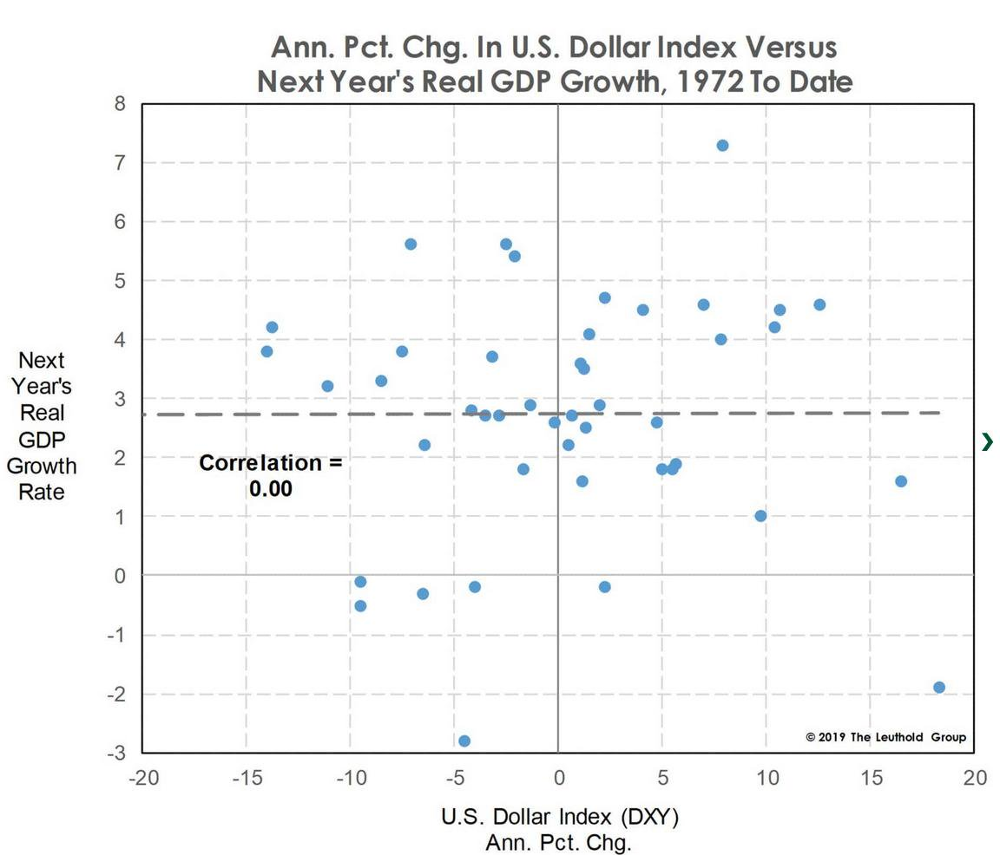




-----------------------------/----------------------------------------------------------------------

1047
5ddae76b86facb54ae6c7330

['Houses offices plants']



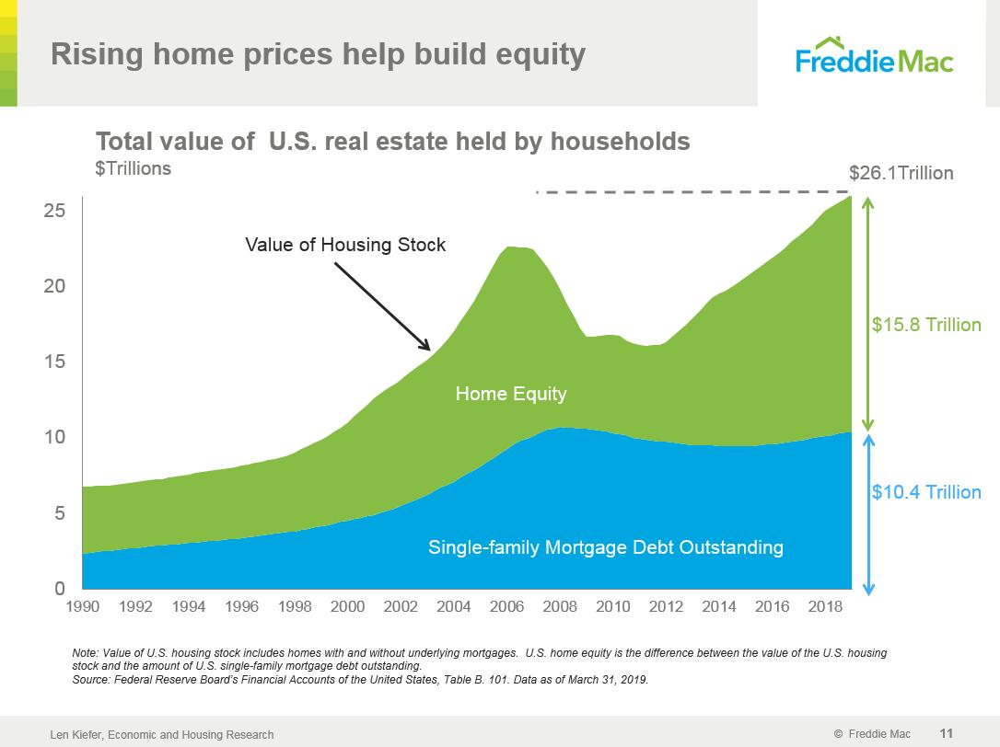




-----------------------------/----------------------------------------------------------------------

1048
5ddae76f86facb54ae6c7336

['Cars clothes and other staff', 'Machinery and construction']



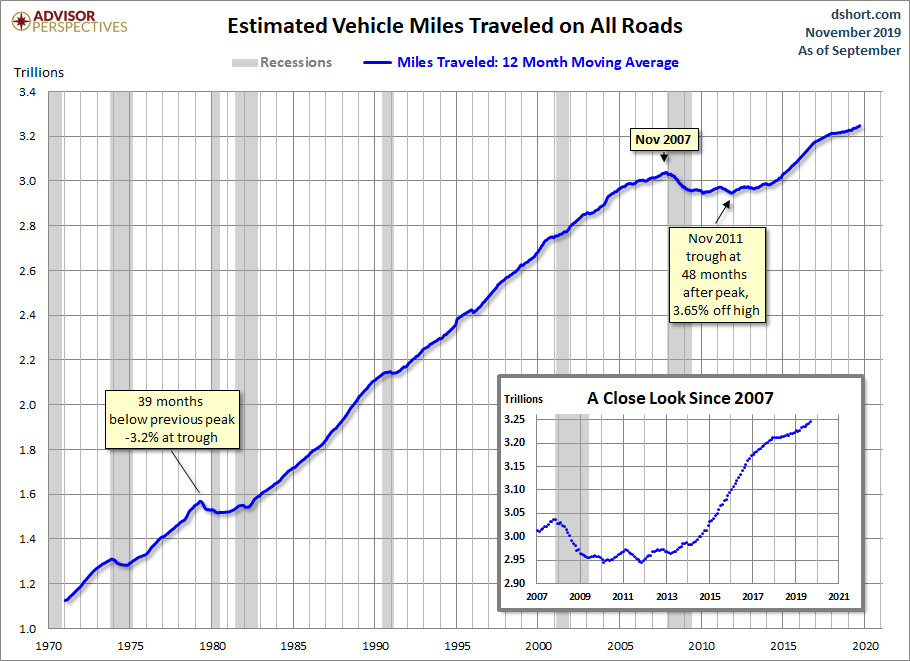




-----------------------------/----------------------------------------------------------------------

1049
5ddae77086facb54ae6c7338

[]



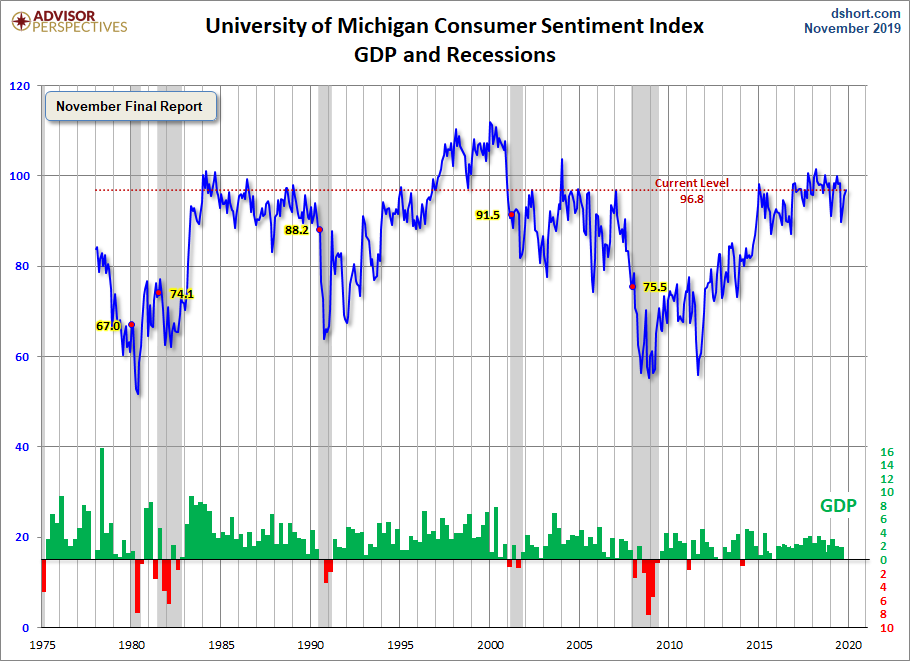




-----------------------------/----------------------------------------------------------------------

1050
5ddae77586facb54ae6c733f

['Houses offices plants']



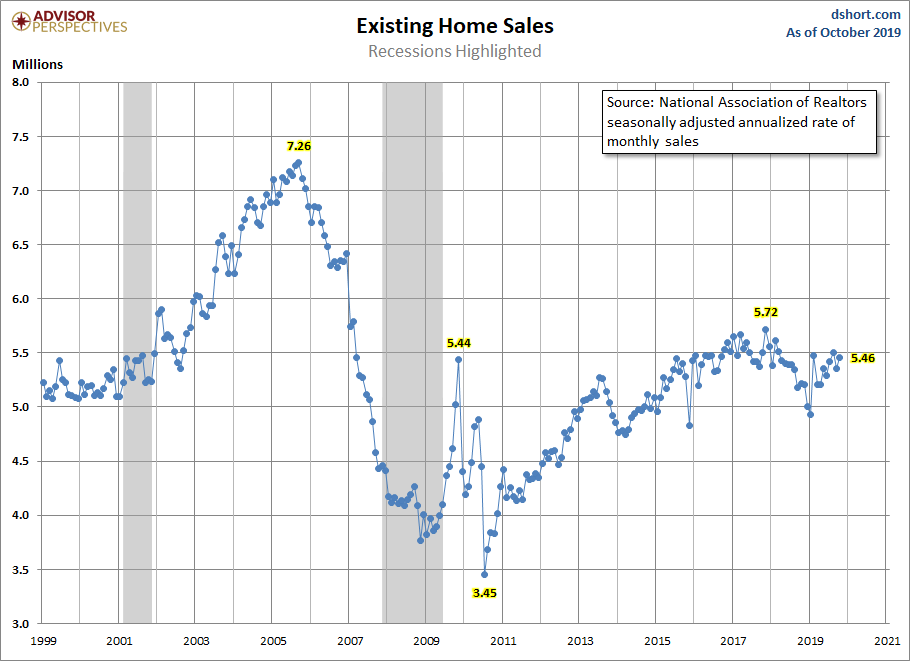




-----------------------------/----------------------------------------------------------------------

1051
5ddae77686facb54ae6c7341

[]



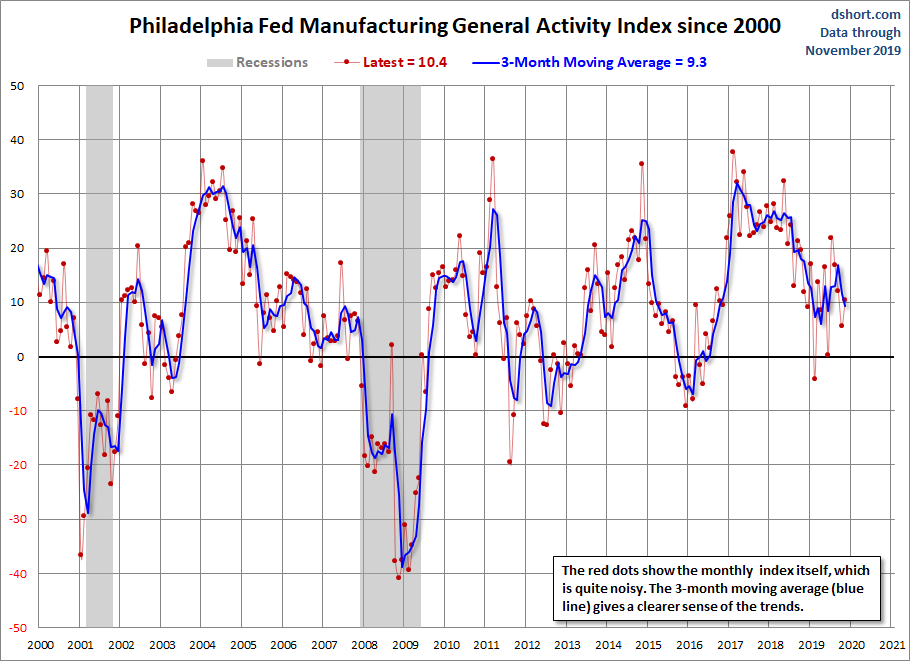




-----------------------------/----------------------------------------------------------------------

1052
5ddae77886facb54ae6c7344

[]



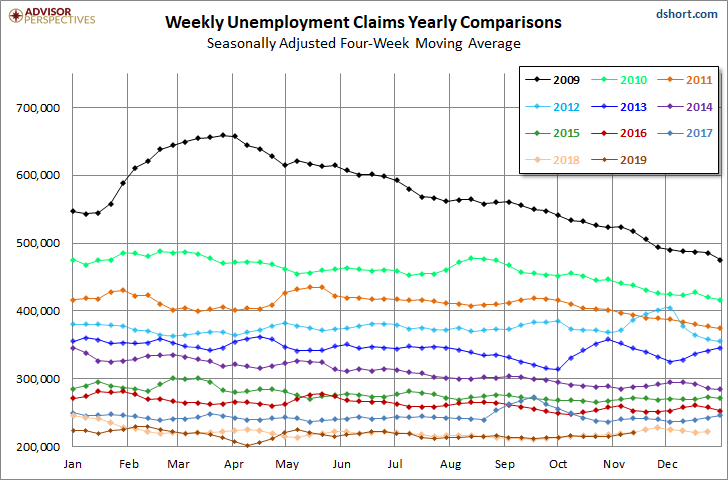




-----------------------------/----------------------------------------------------------------------

1053
5ddae77d86facb54ae6c734c

[]



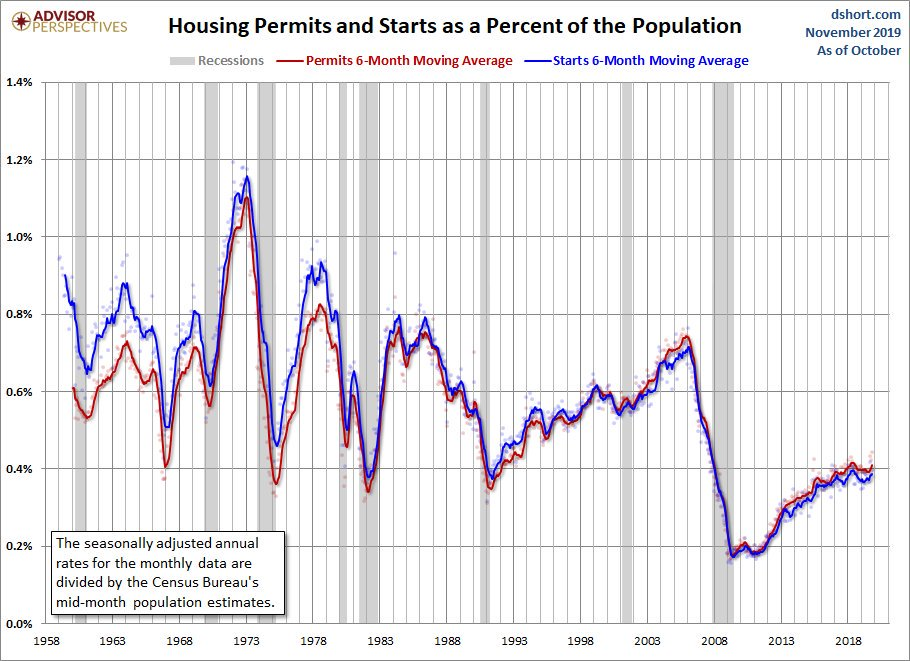




-----------------------------/----------------------------------------------------------------------

1054
5ddaea2986facb54ae6c7422

[]



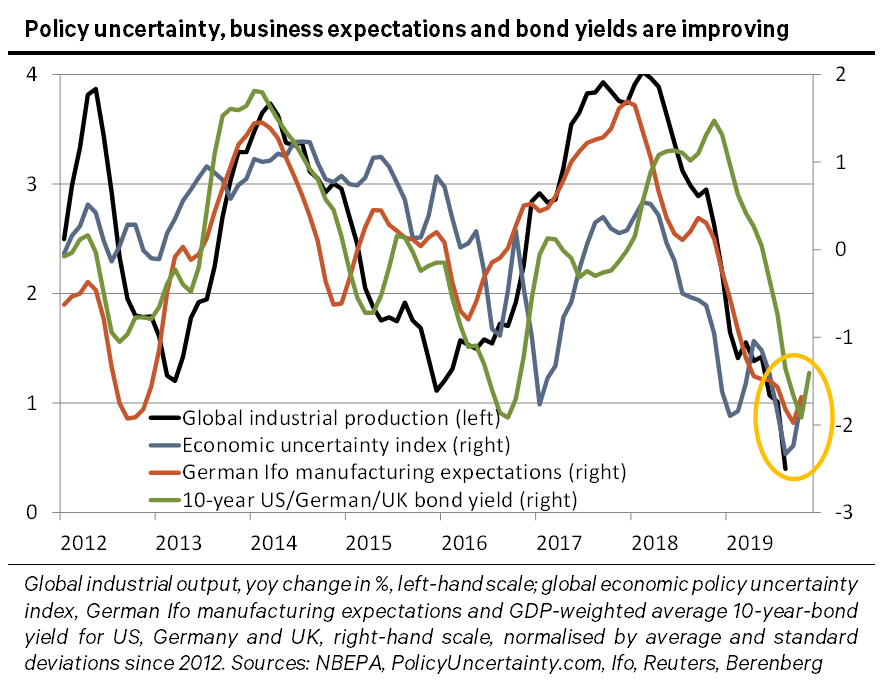




-----------------------------/----------------------------------------------------------------------

1055
5ddaea2a86facb54ae6c7423

['Banks insurance and finance']



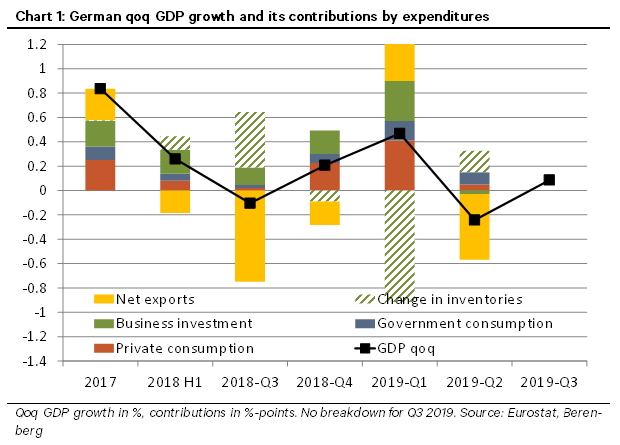




-----------------------------/----------------------------------------------------------------------

1056
5ddaea2b86facb54ae6c7426

[]



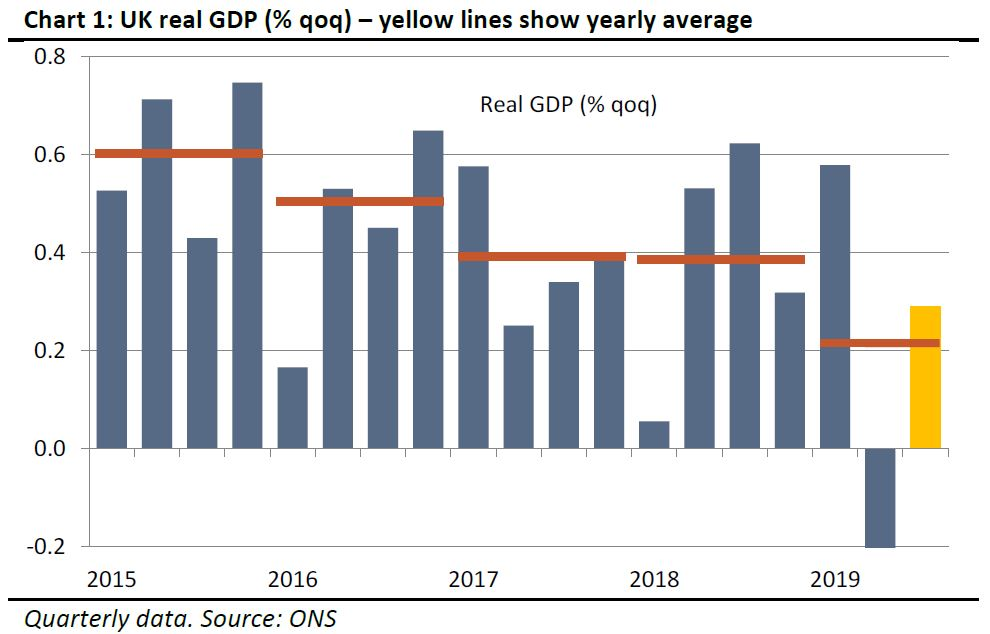




-----------------------------/----------------------------------------------------------------------

1057
5ddaea2c86facb54ae6c7428

[]



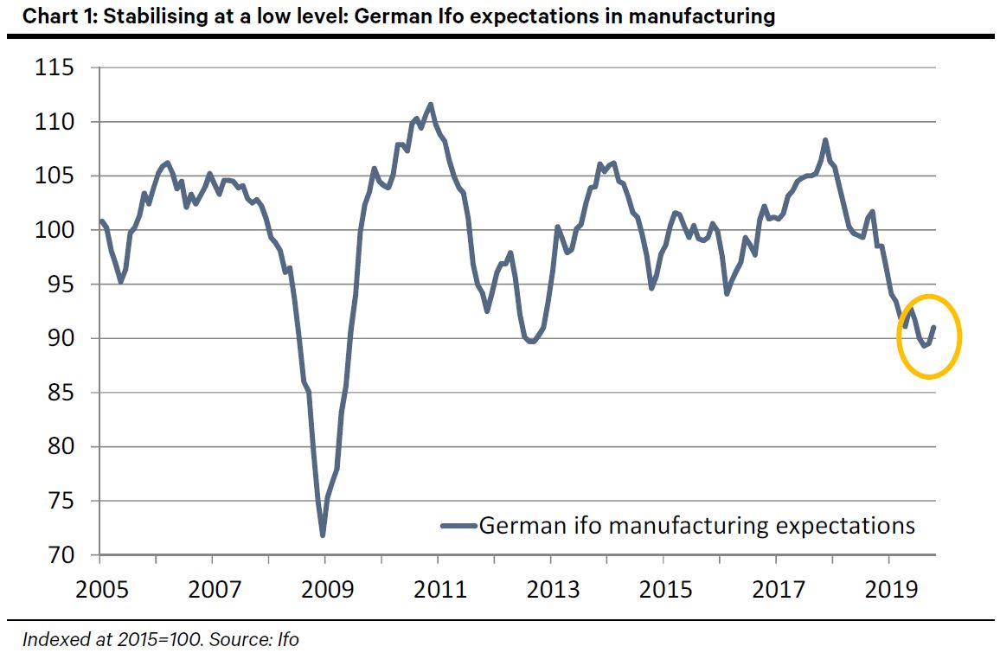




-----------------------------/----------------------------------------------------------------------

1058
5ddaea2d86facb54ae6c742a

[]



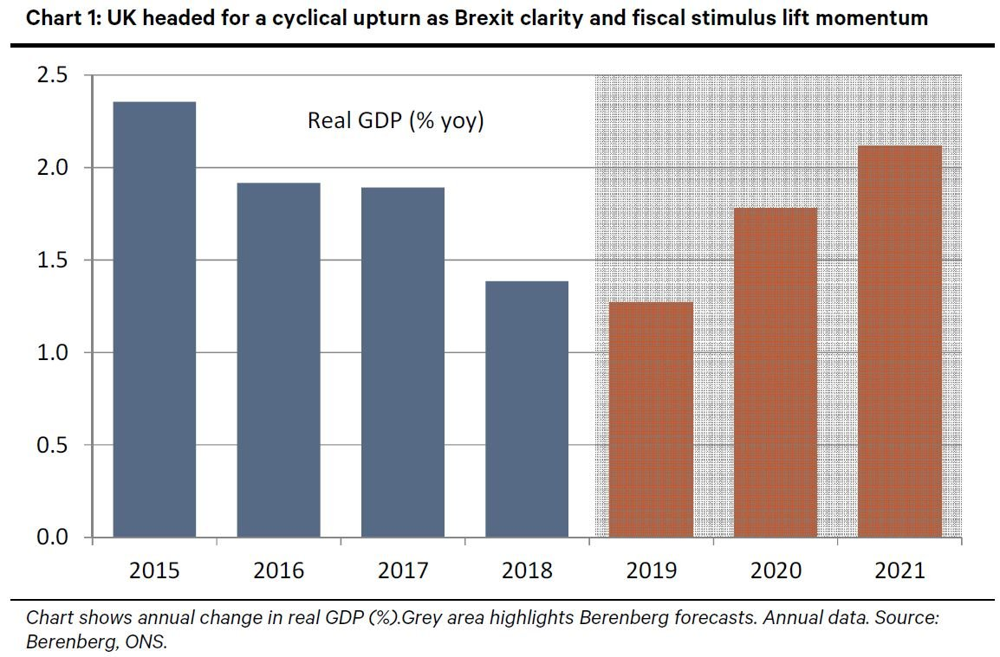




-----------------------------/----------------------------------------------------------------------

1059
5ddaea2e86facb54ae6c742b

[]



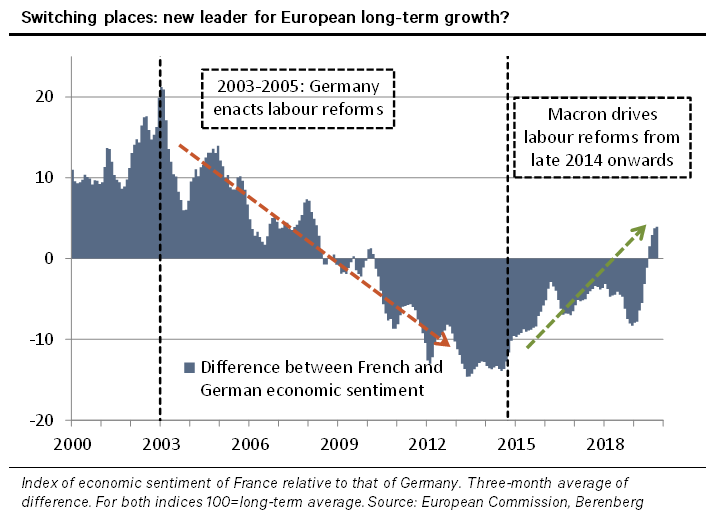




-----------------------------/----------------------------------------------------------------------

1060
5ddaea2f86facb54ae6c742e

[]



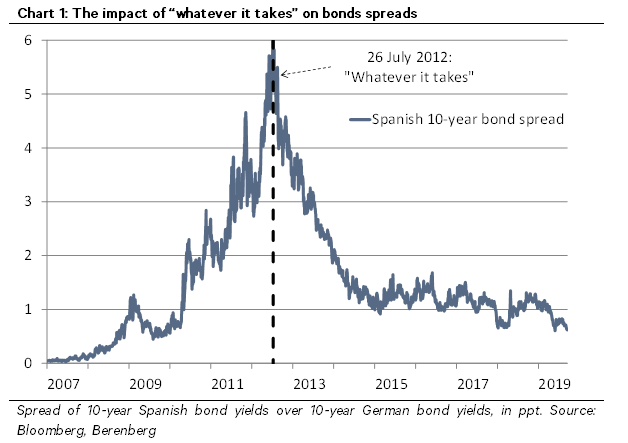




-----------------------------/----------------------------------------------------------------------

1061
5ddaea3286facb54ae6c7434

['Machinery and construction']



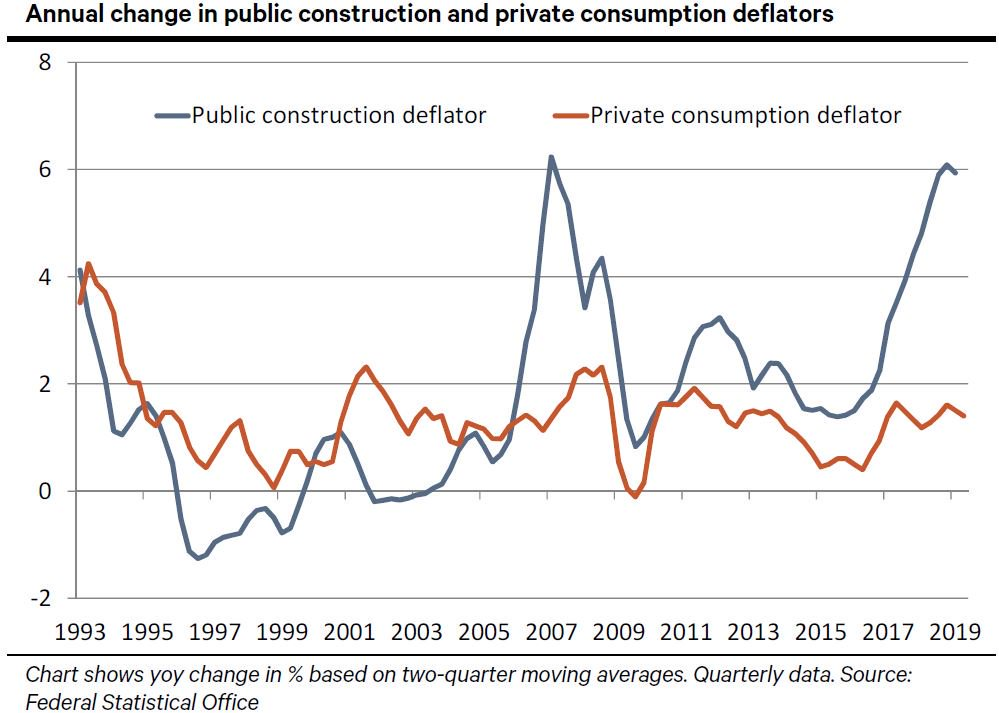




-----------------------------/----------------------------------------------------------------------

1062
5ddaea3386facb54ae6c7436

[]



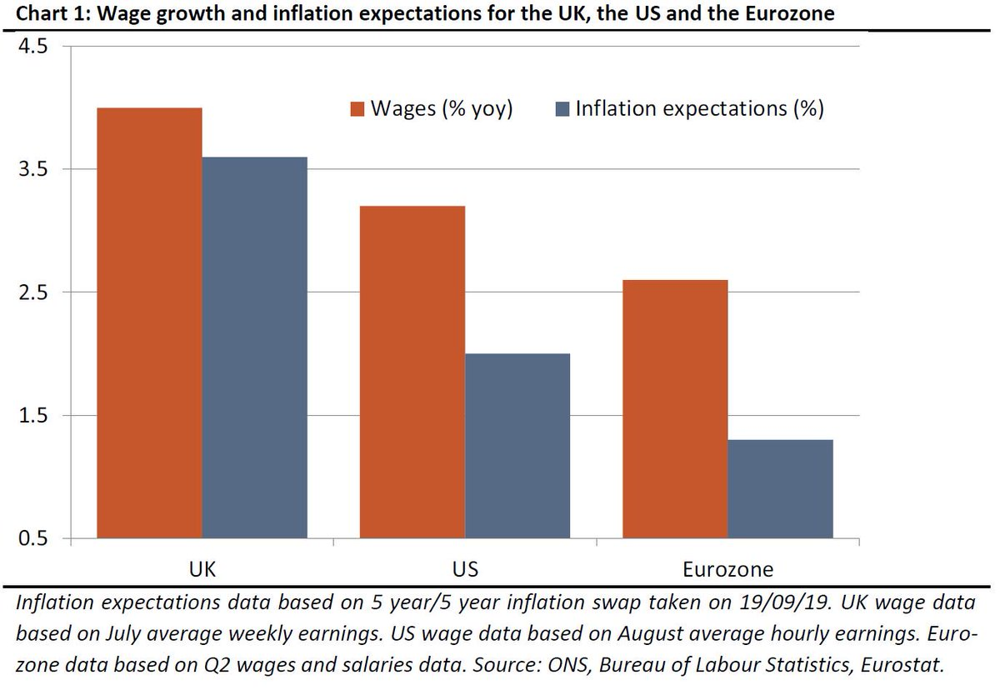




-----------------------------/----------------------------------------------------------------------

1063
5ddaea3586facb54ae6c7438

[]



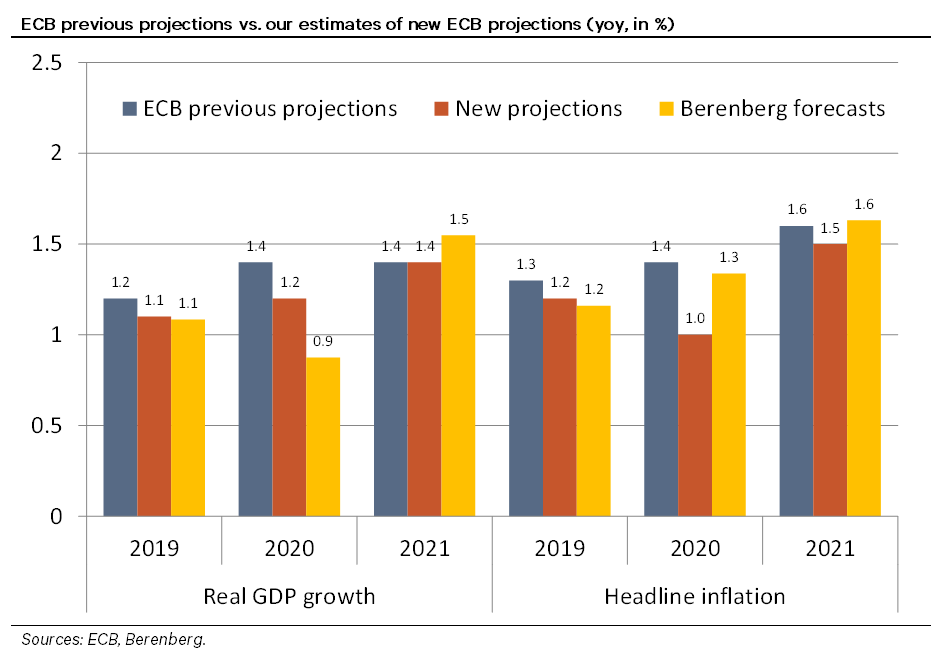




-----------------------------/----------------------------------------------------------------------

1064
5ddaea3786facb54ae6c743b

[]



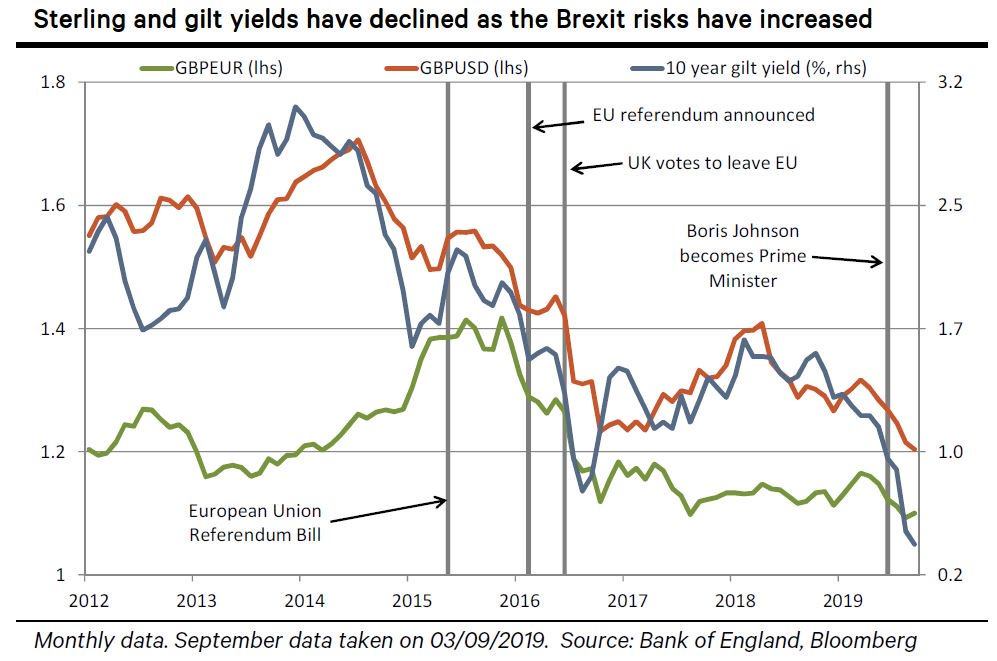




-----------------------------/----------------------------------------------------------------------

1065
5ddaf0214ab838bbbf2e189a

[]



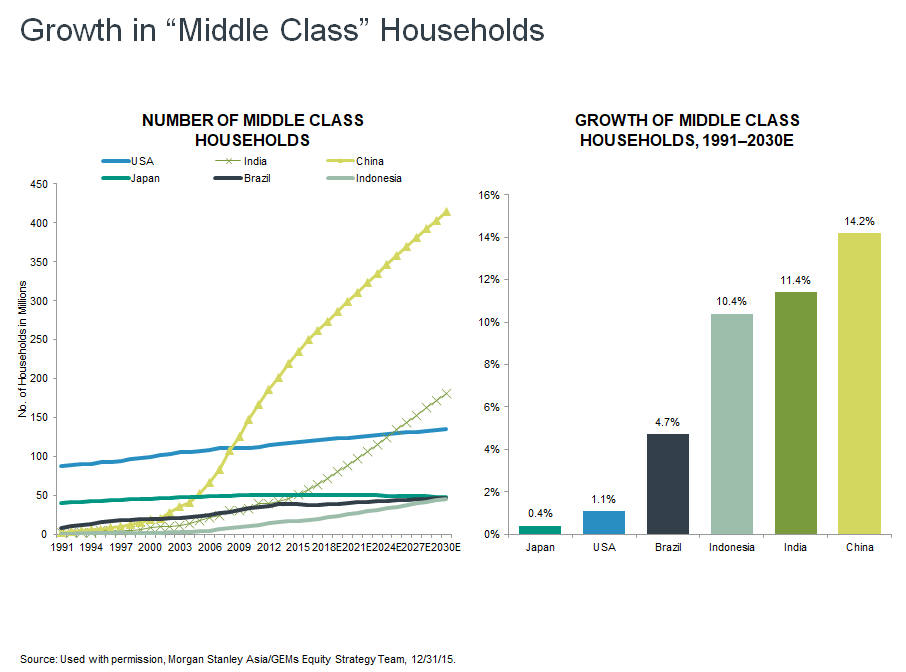




-----------------------------/----------------------------------------------------------------------

1066
5ddaf0224ab838bbbf2e189c

[]



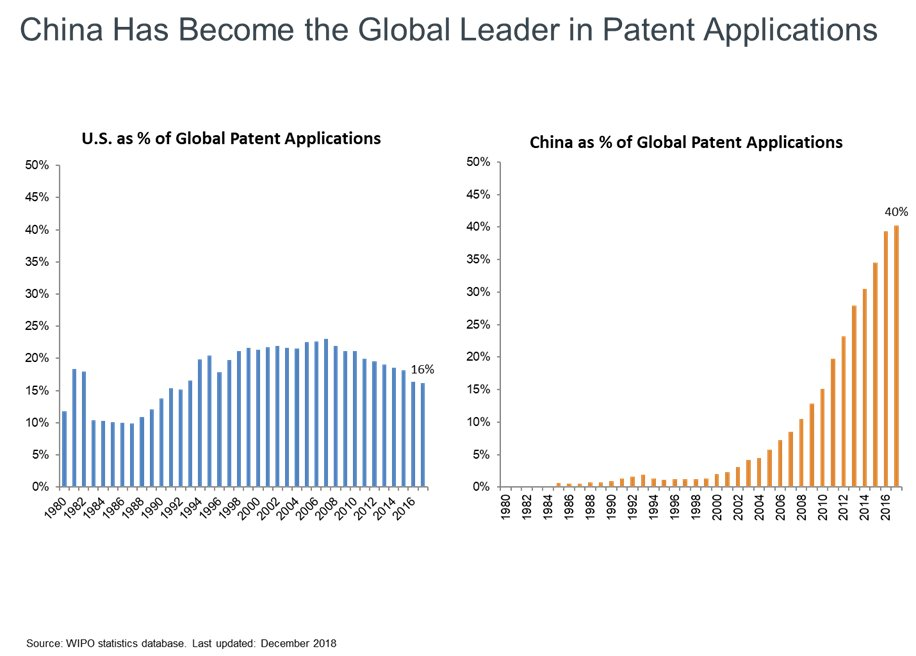




-----------------------------/----------------------------------------------------------------------

1067
5ddaf0c286facb54ae6c7651

['Raw materials', 'Energy sources']



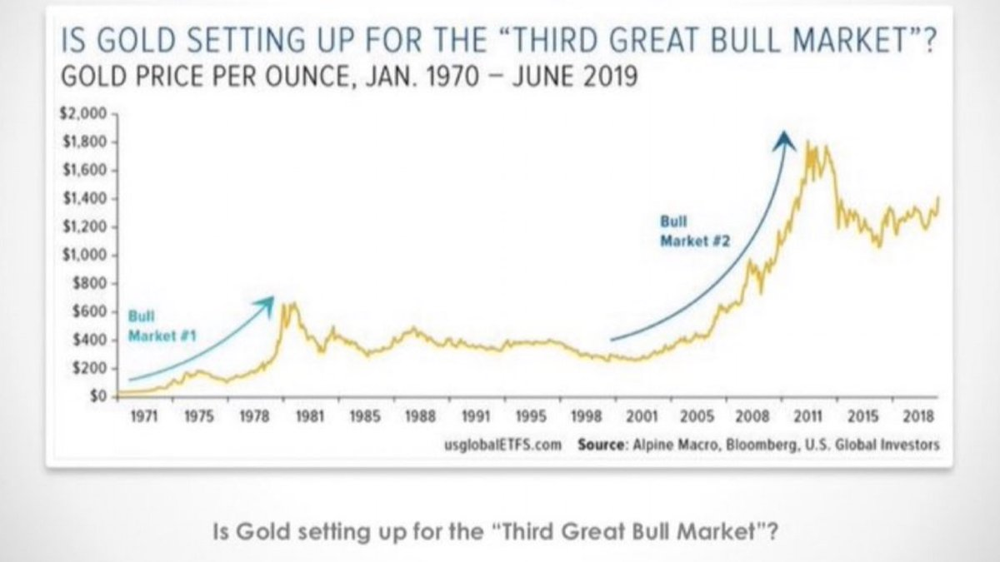




-----------------------------/----------------------------------------------------------------------

1068
5ddaf1354ab838bbbf2e18fc

['Banks insurance and finance']



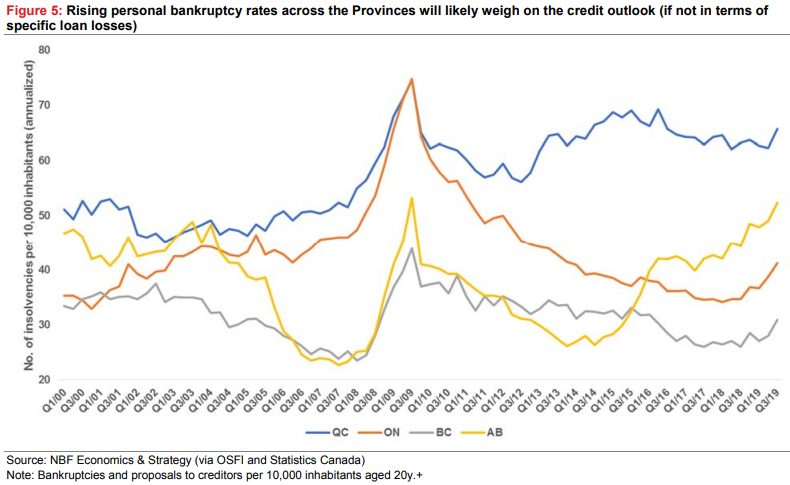




-----------------------------/----------------------------------------------------------------------

1069
5ddaf6804ab838bbbf2e1b2b

[]



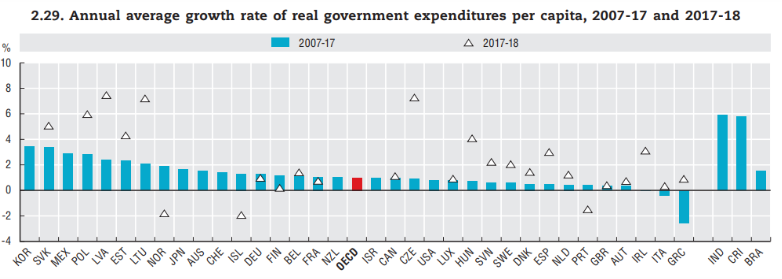




-----------------------------/----------------------------------------------------------------------

1070
5ddaf6904ab838bbbf2e1b43

[]



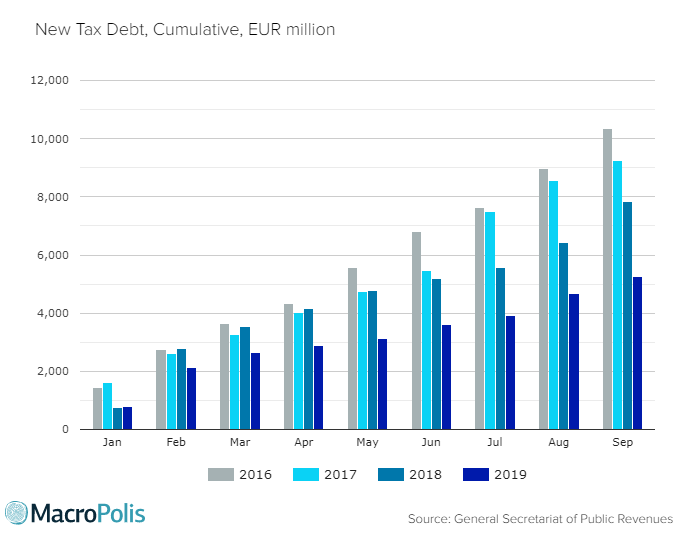




-----------------------------/----------------------------------------------------------------------

1071
5ddaf7c486facb54ae6c7908

[]



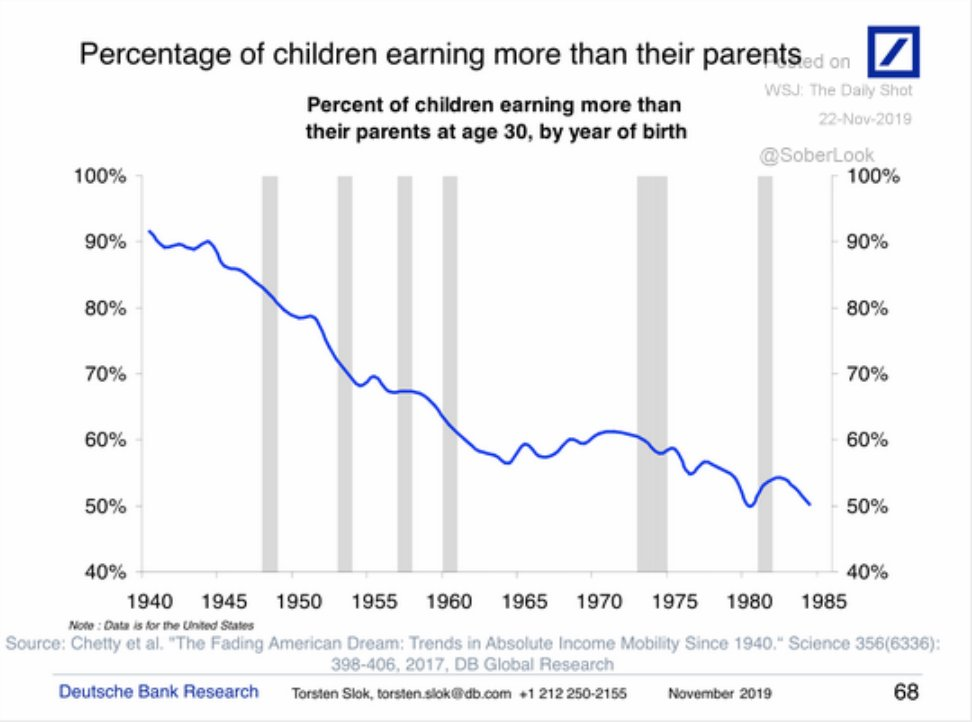




-----------------------------/----------------------------------------------------------------------

1072
5ddaf7c586facb54ae6c7909

['Banks insurance and finance']



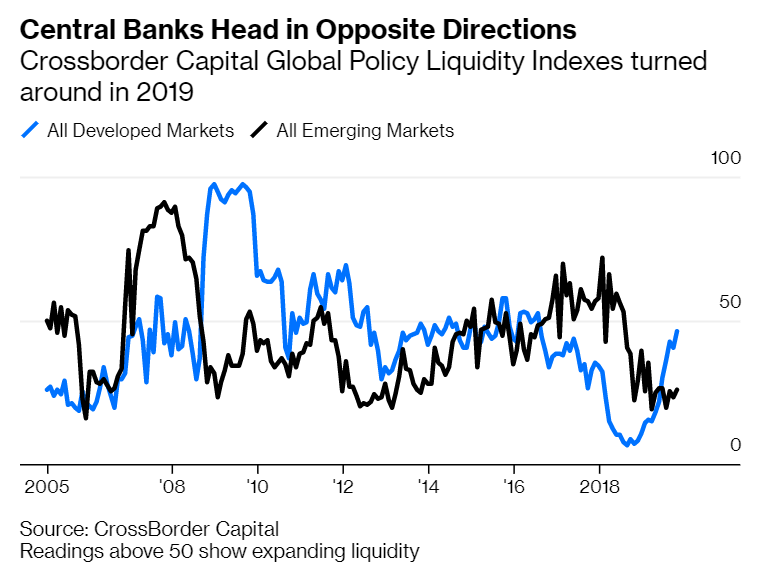




-----------------------------/----------------------------------------------------------------------

1073
5ddafe6c86facb54ae6c7bcb

[]



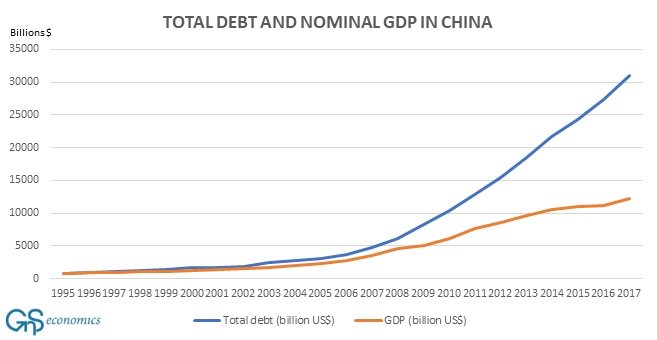




-----------------------------/----------------------------------------------------------------------

1074
5ddb09477a79eaad374d497d

['Energy sources', 'Raw materials']



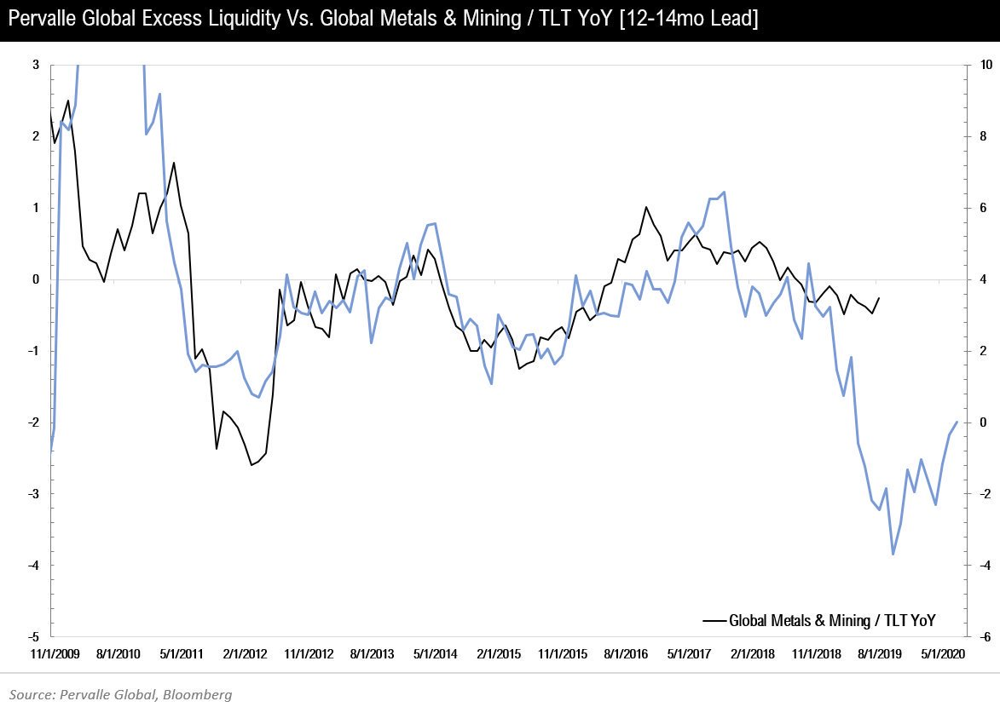




-----------------------------/----------------------------------------------------------------------

1075
5ddb11b27a79eaad374d4d48

[]



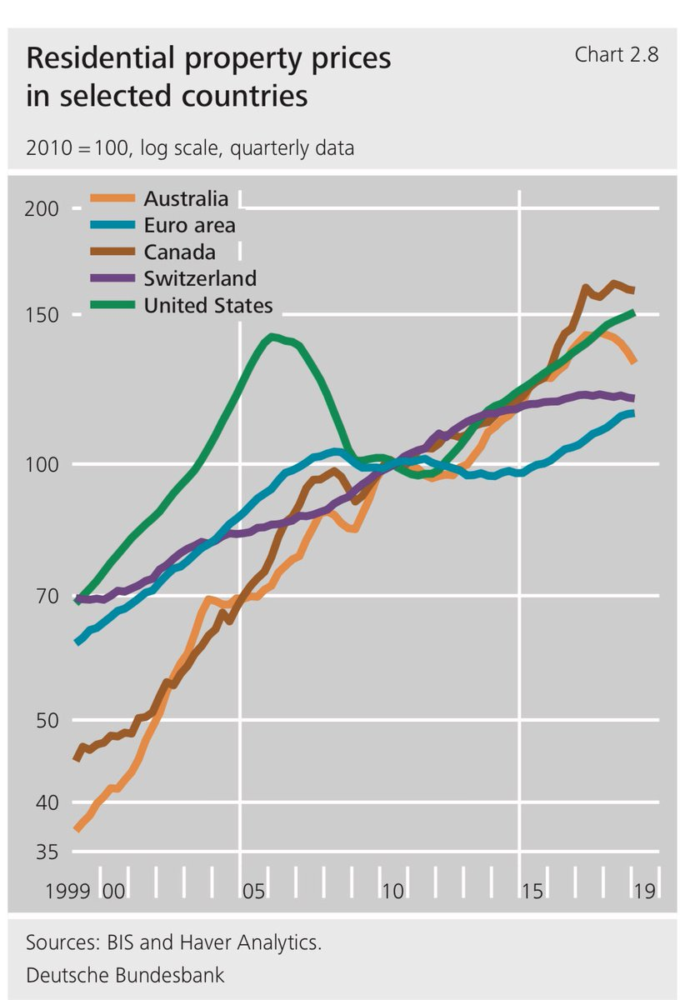




-----------------------------/----------------------------------------------------------------------

1076
5ddb11f37a79eaad374d4d62

[]



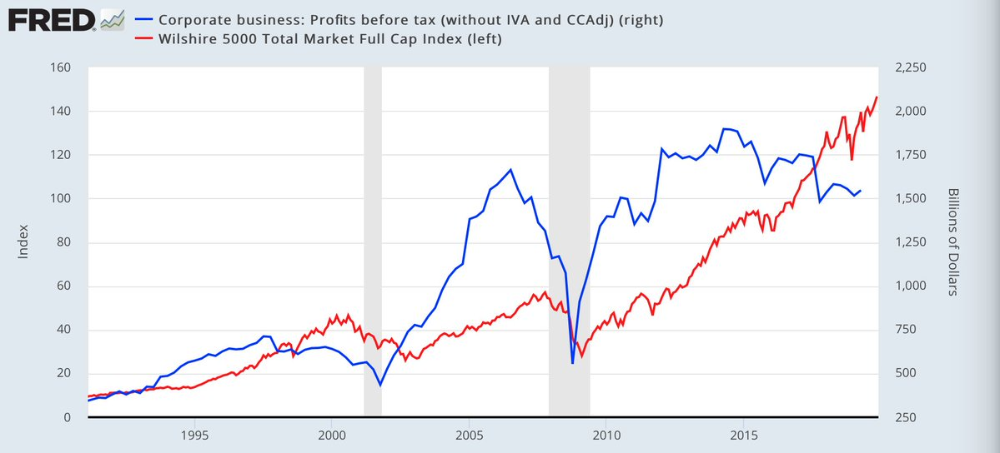




-----------------------------/----------------------------------------------------------------------

1077
5ddb12717a79eaad374d4d7c

[]



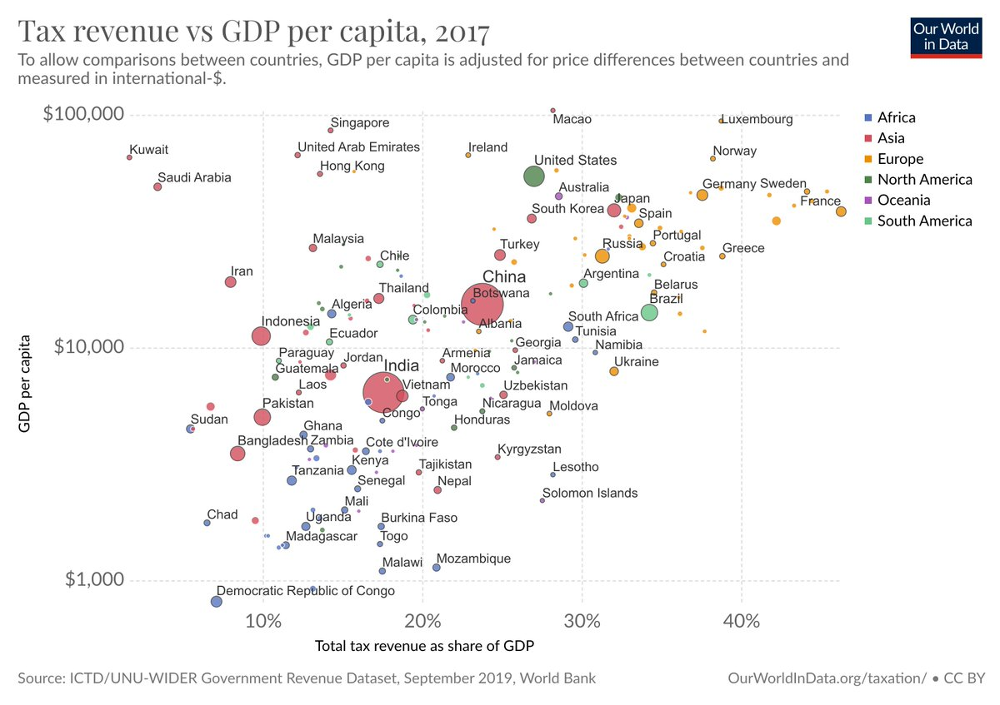




-----------------------------/----------------------------------------------------------------------

1078
5ddb224c120fcc7581548b31

['Banks insurance and finance']



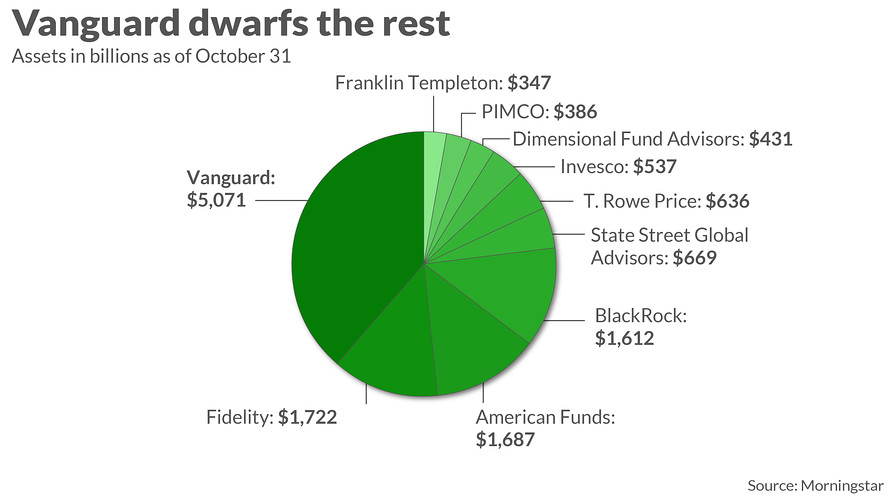




-----------------------------/----------------------------------------------------------------------

1079
5ddb2324530e205d76dea211

[]



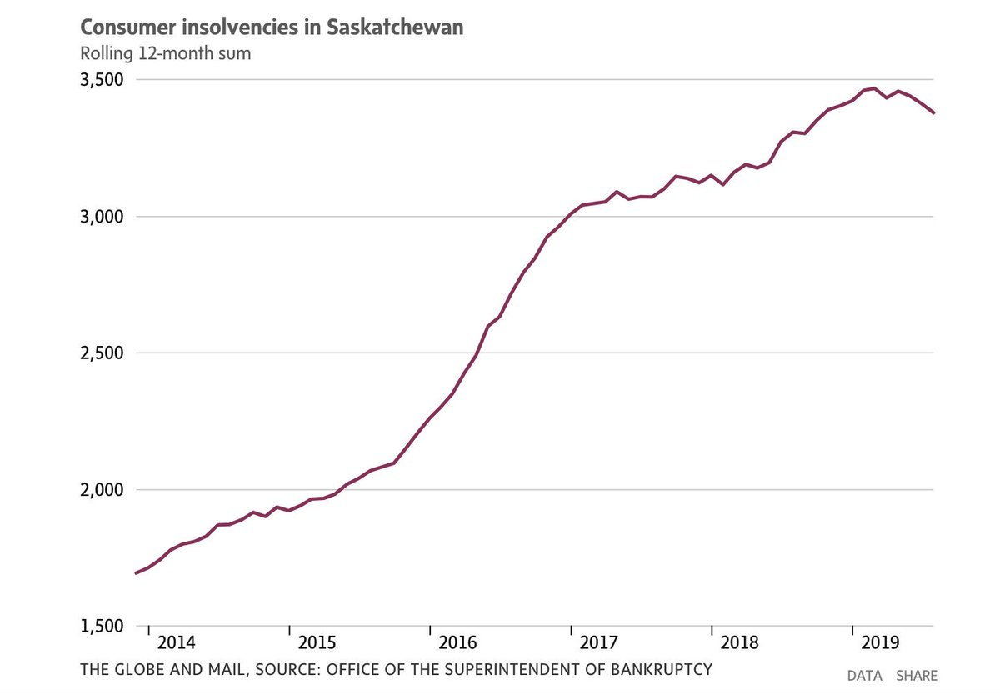




-----------------------------/----------------------------------------------------------------------

1080
5ddb24a9120fcc7581548c00

['Networks and communications']



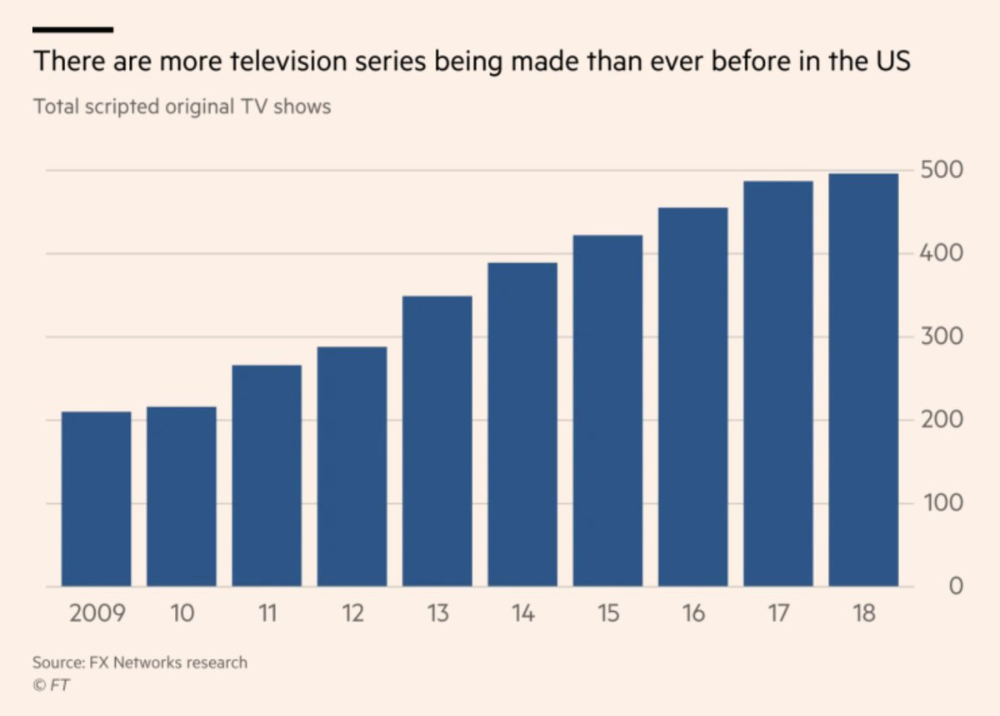




-----------------------------/----------------------------------------------------------------------

1081
5ddb24ae530e205d76dea2aa

['Banks insurance and finance']



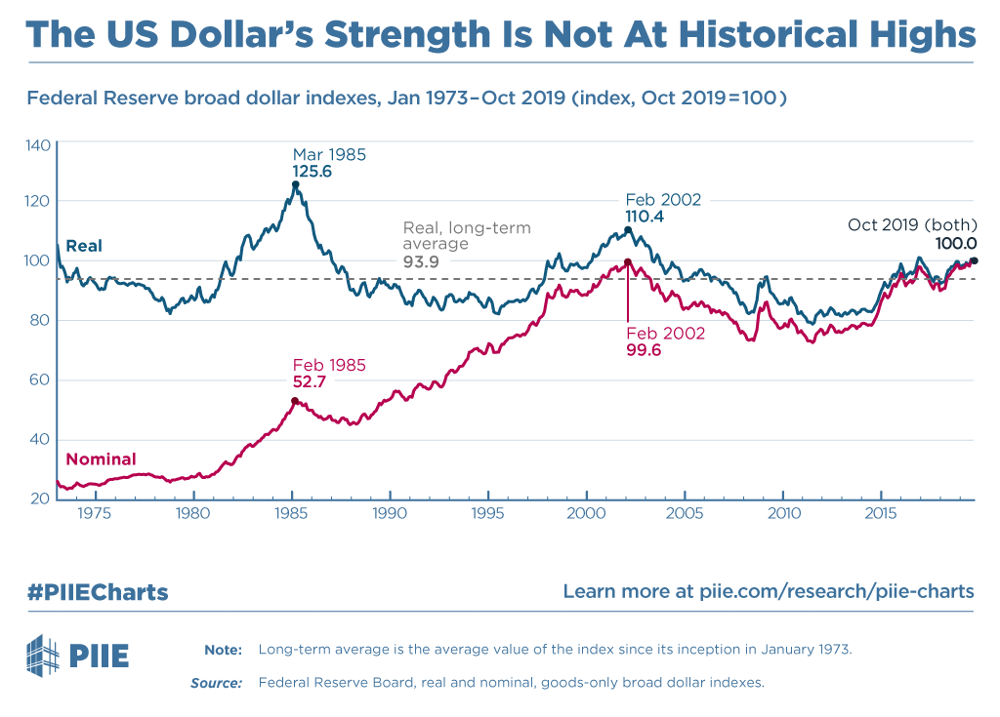




-----------------------------/----------------------------------------------------------------------

1082
5ddb24b1120fcc7581548c0e

['Banks insurance and finance']



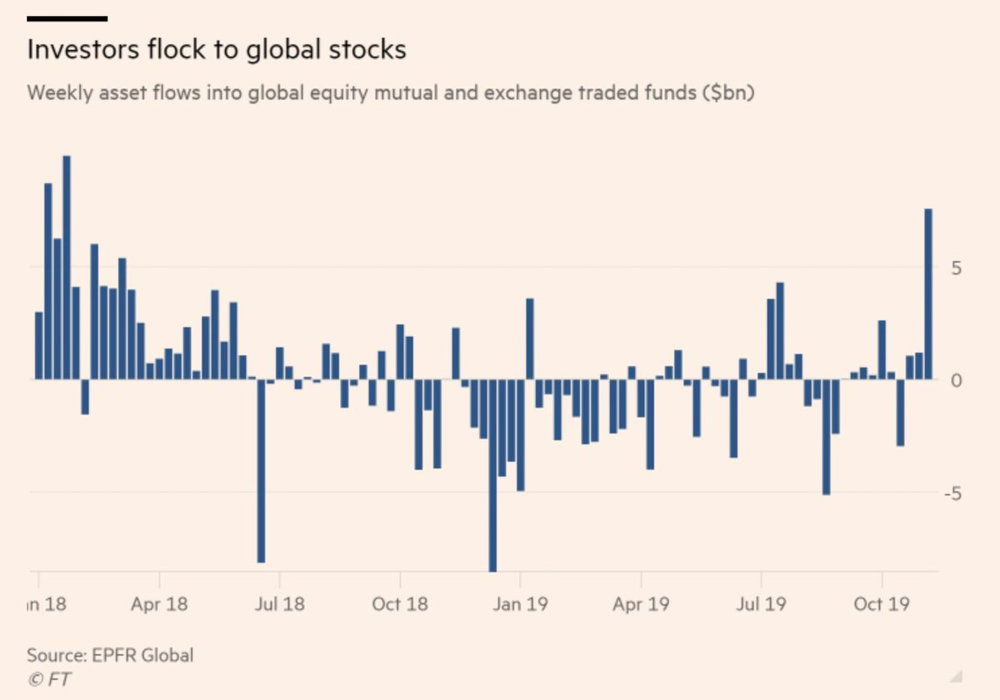




-----------------------------/----------------------------------------------------------------------

1083
5ddb24b1120fcc7581548c0f

['Technology as you know it', 'Networks and communications']



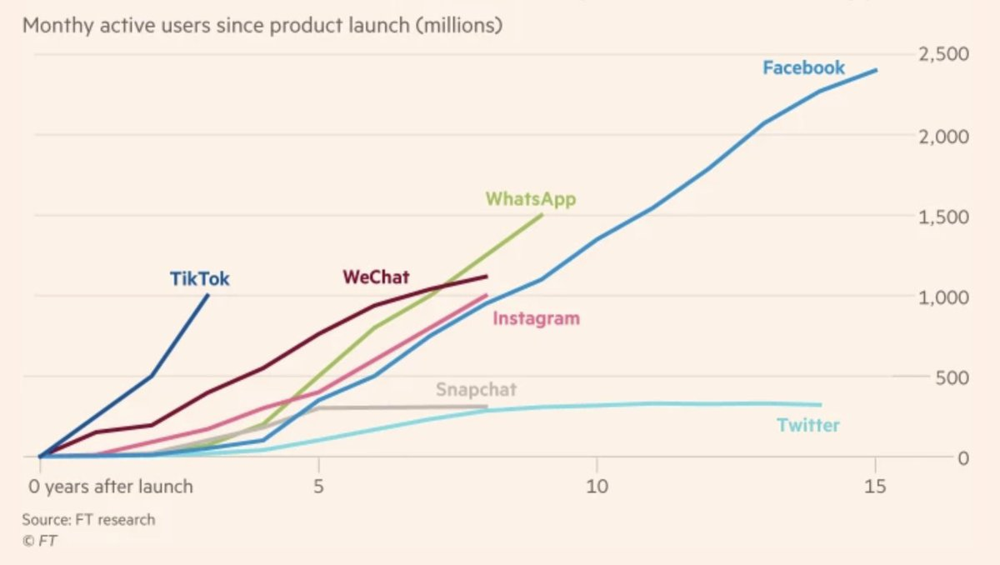




-----------------------------/----------------------------------------------------------------------

1084
5ddb24b2530e205d76dea2b1

['Cars clothes and other staff', 'Eat and drink']



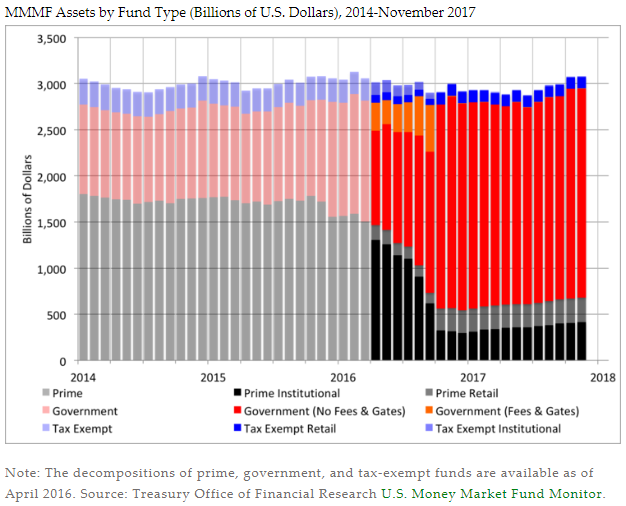




-----------------------------/----------------------------------------------------------------------

1085
5ddb24b2530e205d76dea2b2

['Banks insurance and finance']



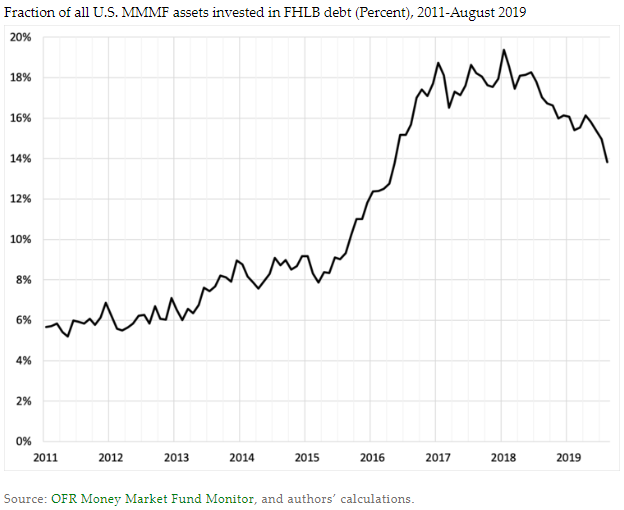




-----------------------------/----------------------------------------------------------------------

1086
5ddb24b7120fcc7581548c18

['Energy sources', 'Water roads electricity']



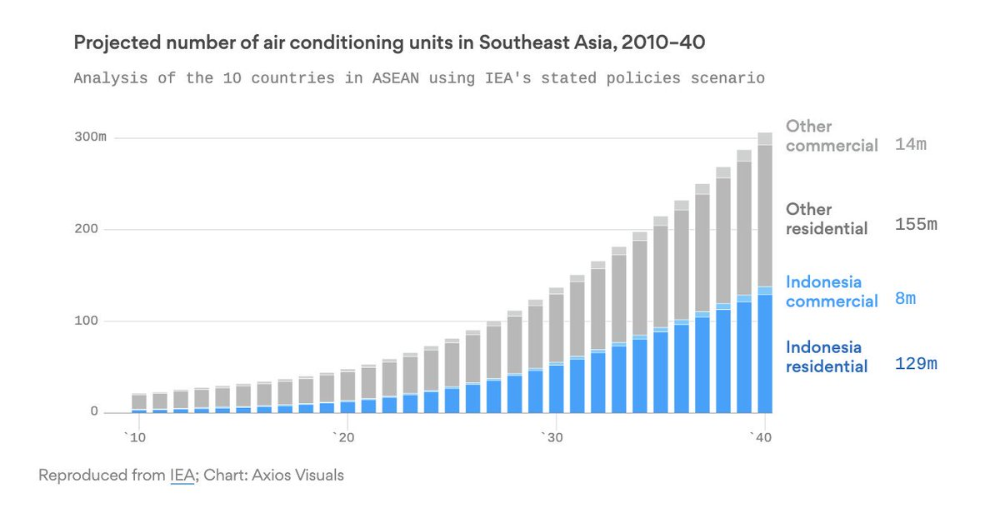




-----------------------------/----------------------------------------------------------------------

1087
5ddb24c1120fcc7581548c28

['Eat and drink', 'Cars clothes and other staff']



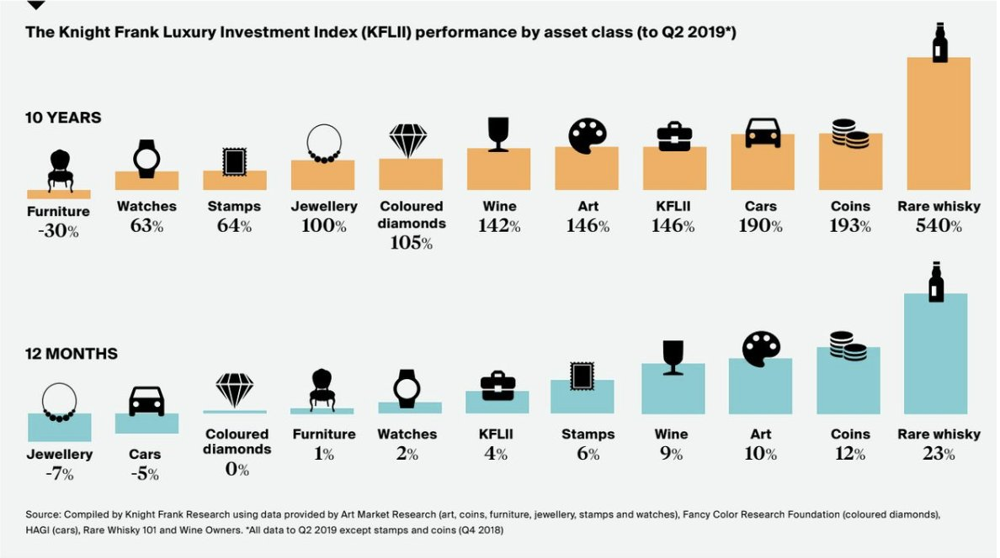




-----------------------------/----------------------------------------------------------------------

1088
5ddb3a76120fcc7581549068

['Banks insurance and finance']



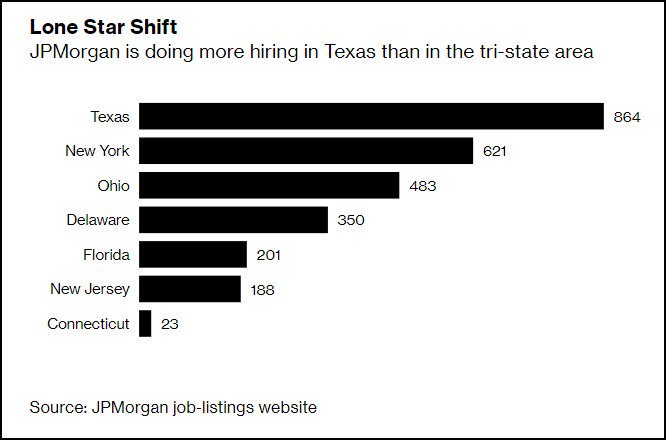




-----------------------------/----------------------------------------------------------------------

1089
5ddb3dfe120fcc758154916c

[]



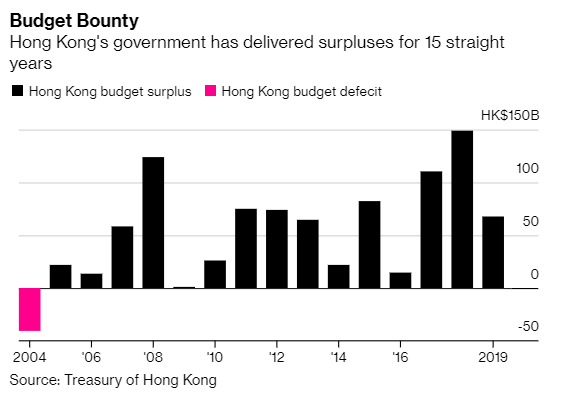




-----------------------------/----------------------------------------------------------------------

1090
5ddb421d120fcc75815492fd

['Eat and drink', 'Your health']



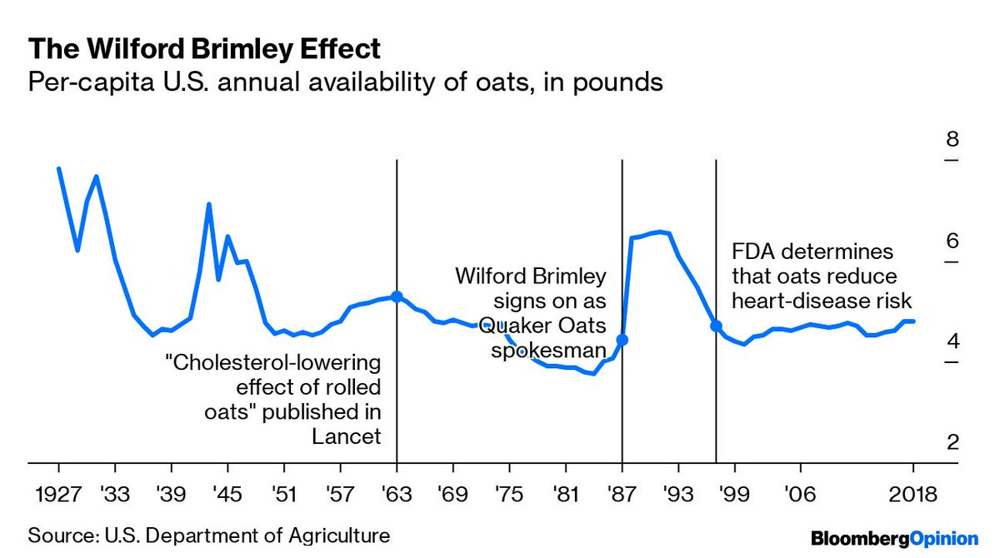




-----------------------------/----------------------------------------------------------------------

1091
5ddb421d120fcc75815492fe

[]



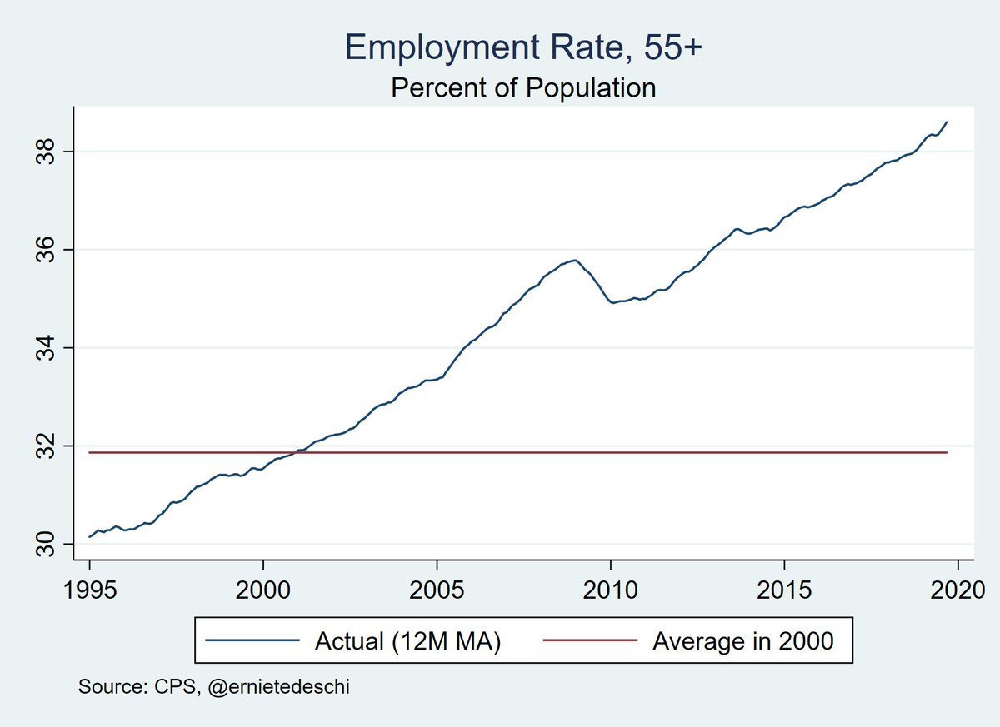




-----------------------------/----------------------------------------------------------------------

1092
5ddb421e120fcc75815492ff

['Eat and drink']



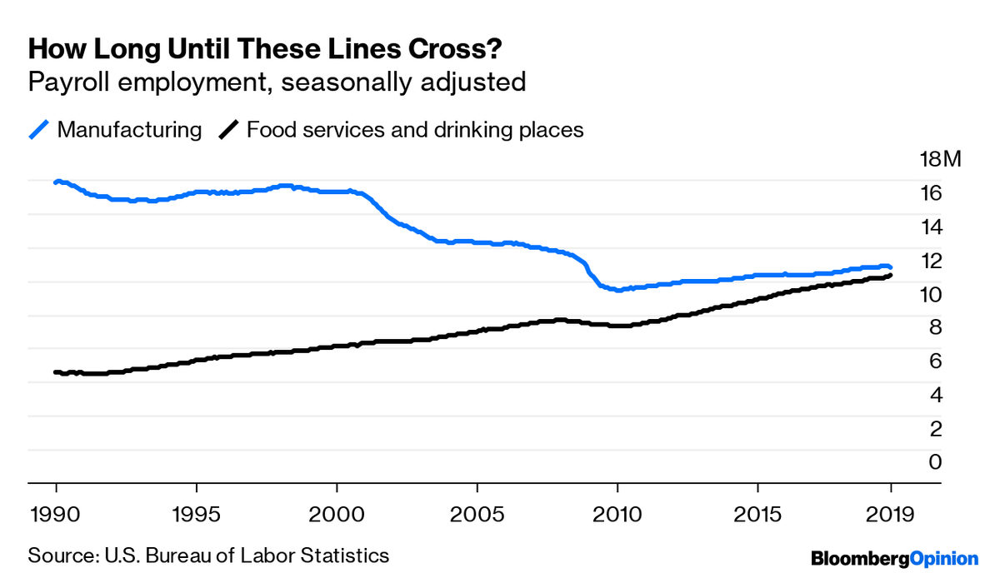




-----------------------------/----------------------------------------------------------------------

1093
5ddb421f120fcc7581549301

['Energy sources']



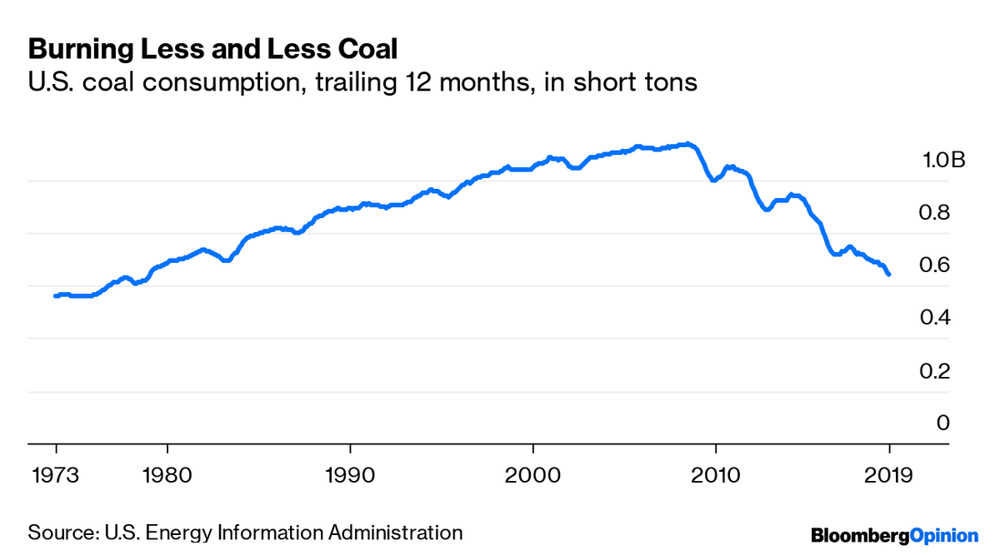




-----------------------------/----------------------------------------------------------------------

1094
5ddb4220120fcc7581549302

['Energy sources', 'Raw materials']



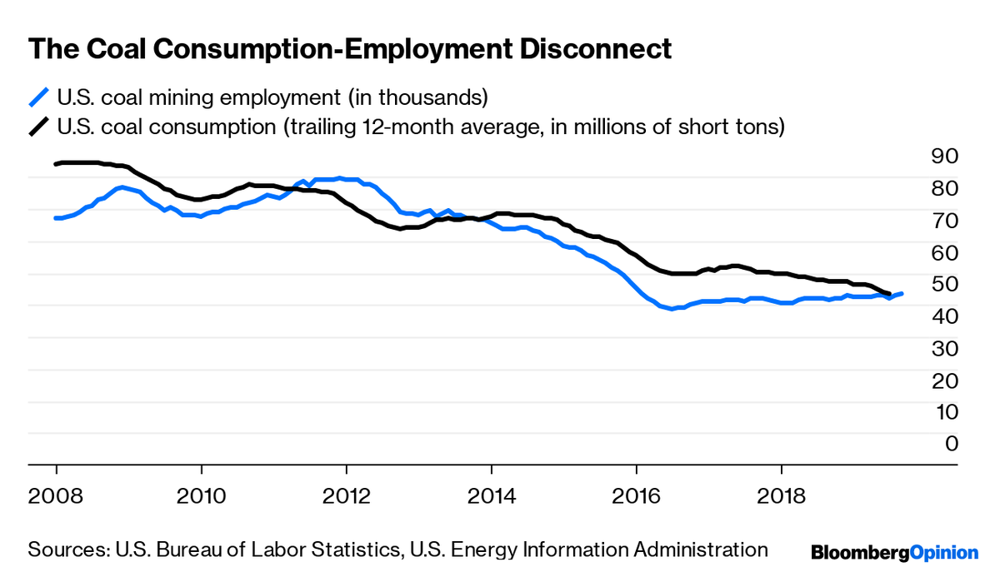




-----------------------------/----------------------------------------------------------------------

1095
5ddb4225120fcc7581549309

['Cars clothes and other staff', 'Eat and drink']



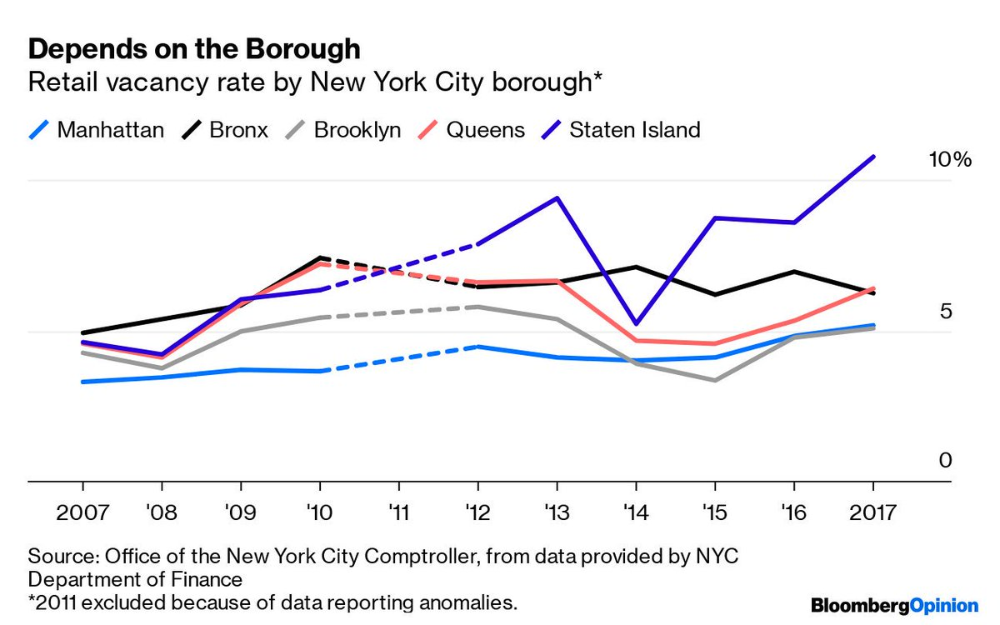




-----------------------------/----------------------------------------------------------------------

1096
5ddb5770932aa35fe8a37551

[]



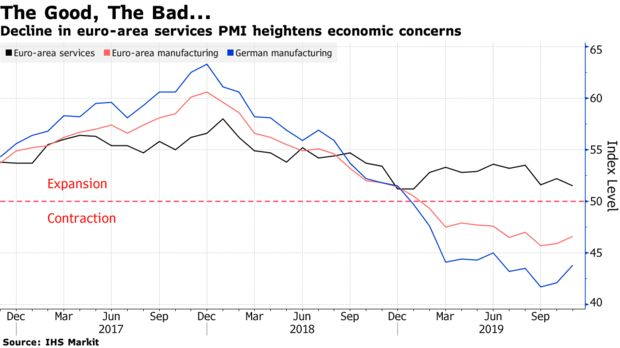




-----------------------------/----------------------------------------------------------------------

1097
5ddb5856120fcc75815496c2

['Energy sources', 'Raw materials']



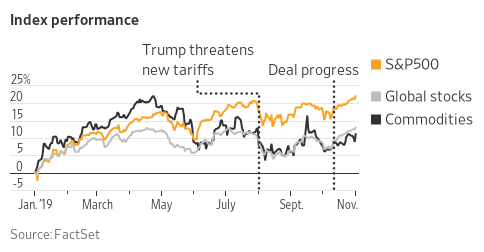




-----------------------------/----------------------------------------------------------------------

1098
5ddb5861120fcc75815496d2

[]



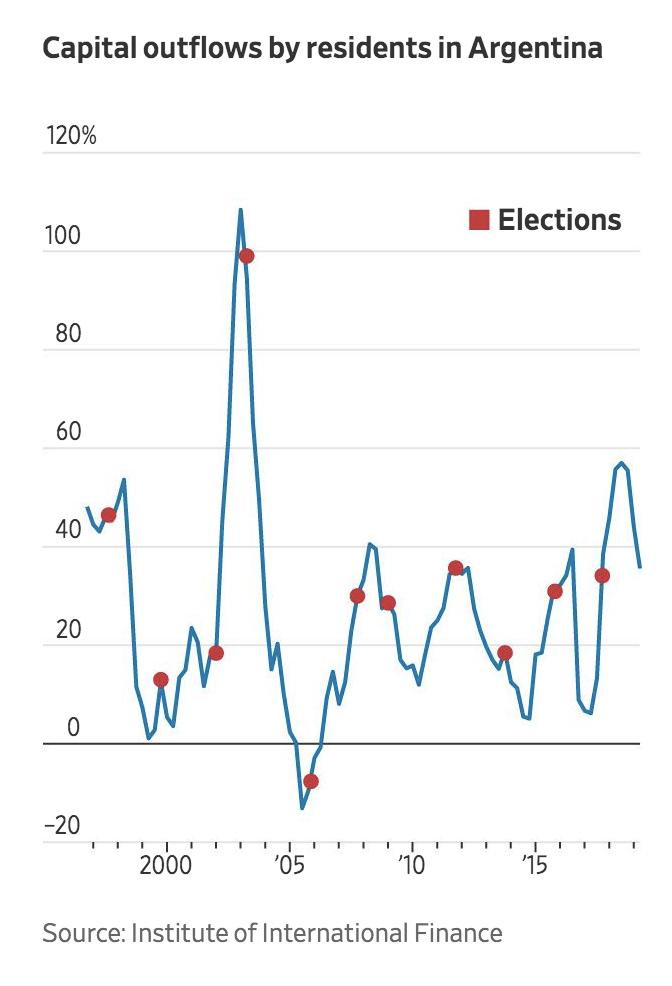




-----------------------------/----------------------------------------------------------------------

1099
5ddb5d47932aa35fe8a377b3

[]



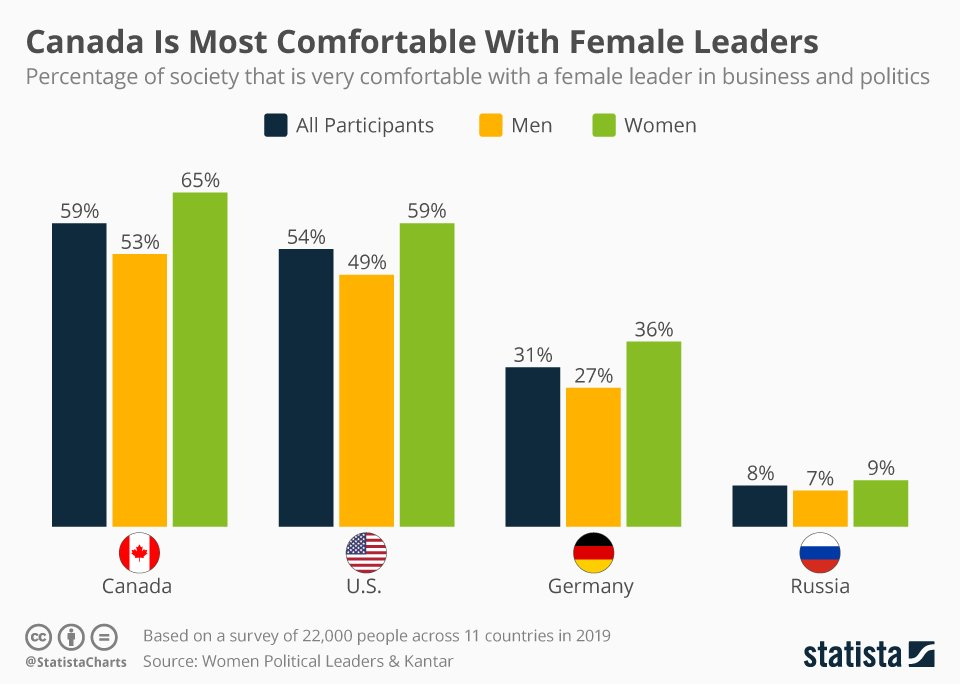




-----------------------------/----------------------------------------------------------------------

1100
5ddb5d4b932aa35fe8a377bb

[]



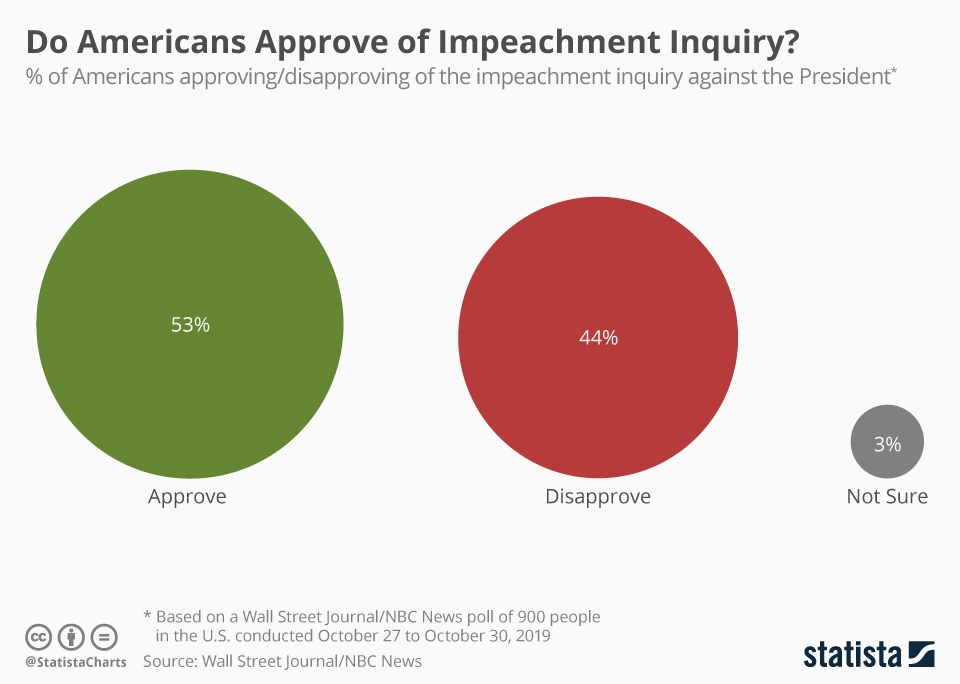




-----------------------------/----------------------------------------------------------------------



In [4]:
data = db_client["tweets_pipeline_v2"].find({"$or": [{"status":"graphicone_search"}, {"status":"graphicone_feed"}],
                                            "grafeed_industries": {"$exists": True},
                                            "s3_url": {"$exists": True},
                                            "extracted_text": {"$exists": True}})


minV = 985
maxV = 1100
for index, i in enumerate(data):
    if index >= minV and index <= maxV:
        try:
            image = Image(i['s3_url'], unconfined=True)
            print(index)
            print(i["_id"])
            print()
            indus = i["grafeed_industries"]
            indus = [re.sub(r"[,]","", row) for row in indus]        
            print(indus)
            print()
            display(image)
            print()
            print()
            print()
            print("-----------------------------/----------------------------------------------------------------------")
            print()
        except Exception as err:
            pass